In [1]:
%run '../dynamo_helper_functions.ipynb'

/tmp/ipykernel_2909806/3777615979.py:1: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


['/net/capricorn/home/xing/soh29/.conda/envs/dynamo_06_2024/lib/python3.8/site-packages/dynamo']


package,umap-learn,trimap,tqdm,statsmodels,setuptools,seaborn,scipy,scikit-learn,python-igraph,pynndescent,pre-commit,pandas,numpy,numdifftools,numba,networkx,matplotlib,loompy,hdbscan,dynamo-release,cvxopt,colorcet
version,0.5.6,1.1.4,4.66.4,0.14.1,70.1.0,0.13.2,1.10.1,1.3.2,0.11.5,0.5.8,3.5.0,1.2.0,1.23.0,0.9.41,0.51.2,3.1,3.7.5,3.0.7,0.8.37,1.0.0,1.3.2,3.1.0


In [4]:
#import helper_functions
from sklearn import preprocessing
from shapely.geometry import MultiPoint
from shapely.geometry import Point
from shapely.geometry import Polygon
from scipy.interpolate import interp1d
from matplotlib.patches import Patch
import matplotlib.pyplot as plt
import copy
from tslearn.clustering import TimeSeriesKMeans
from sklearn.manifold import TSNE
from tslearn.utils import to_time_series_dataset
import plotly.express as px
import plotly.graph_objects as go
from sklearn.cluster import SpectralClustering
from pydiffmap import diffusion_map as dm

In [ ]:
doses = [0,12,25,50,100,200,400,800]
phases = ['G1.S', 'S', 'G2', 'G2.M', 'M.G1']
colors = {'G1.S':'firebrick', 'S':'orange', 'G2':'yellowgreen', 'G2.M':'teal', 'M.G1':'royalblue'}
colors2 = {'G1-S':'firebrick', 'S':'orange', 'G2-M':'yellowgreen', 'M':'teal', 'M-G1':'royalblue'}
colors2_px = {'G1-S':'rgb(178,34,34)', 'S':'rgb(255,165,0)', 'G2-M':'rgb(154,205,50)', 'M':'rgb(0,128,128)', 'M-G1':'rgb(65,105,225)'}

In [2]:
path_dict = {'path1':'rgb(255,215,0)',
             'path2':'rgb(135,206,250)'}

# Load data

In [6]:
adata = dyn.read_loom("../../data/static_MCF10A/processed_possorted_genome_bam_RIG79.loom")
temp = np.empty((len(adata.obs),1), dtype=object)
temp.shape
for i in range(len(adata.obs)):
    temp[i] = str(int(float(adata.obs['dosage'][i])))
adata.obs['dosage'] = temp

In [8]:
adata_list = []
for i in range(len(doses)):
    adata_list.append(adata[adata.obs['dosage'] == str(doses[i])])

In [10]:
for i in range(len(doses)):
    dyn.pp.recipe_monocle(adata_list[i], keep_filtered_genes=True)

|-----> apply Monocole recipe to adata...
|-----> <insert> pp to uns in AnnData Object.
|-----------> <insert> has_splicing to uns['pp'] in AnnData Object.
|-----------> <insert> has_labling to uns['pp'] in AnnData Object.
|-----------> <insert> splicing_labeling to uns['pp'] in AnnData Object.
|-----------> <insert> has_protein to uns['pp'] in AnnData Object.
|-----> ensure all cell and variable names unique.
|-----> ensure all data in different layers in csr sparse matrix format.
|-----> ensure all labeling data properly collapased
|-----------> <insert> tkey to uns['pp'] in AnnData Object.
|-----------> <insert> experiment_type to uns['pp'] in AnnData Object.
|-----> filtering cells...
|-----> filtering genes...
|-----> calculating size factor...
|-----> selecting genes...
|-----> <insert> frac to var in AnnData Object.
|-----> size factor normalizing the data, followed by log1p transformation.
|-----> applying PCA ...
|-----> <insert> pca_fit to uns in AnnData Object.
|-----> <inse

In [11]:
dose_data = []
for i in range(len(doses)):
    temp = pd.read_csv(gen_data_path+'revelio_DC/DC_dose_'+str(doses[i])+'.csv', index_col=0)
    dose_data.append(temp)

In [ ]:
# Load untreated MCF10A cell cycle coordinate
xi = np.load("../../data/static_MCF10A/generated_data/interp_xi.npy")
yi = np.load("../../data/static_MCF10A/generated_data/interp_yi.npy")

In [13]:
dose25_df = pd.read_csv("../../data/static_MCF10A/generated_data/dose25/dose25_CC_EMT_adjusted.csv", index_col=0)

In [15]:
dose_data[2]['new X'] = dose25_df['new X']
dose_data[2]['EMT axis'] = dose25_df['DC3']

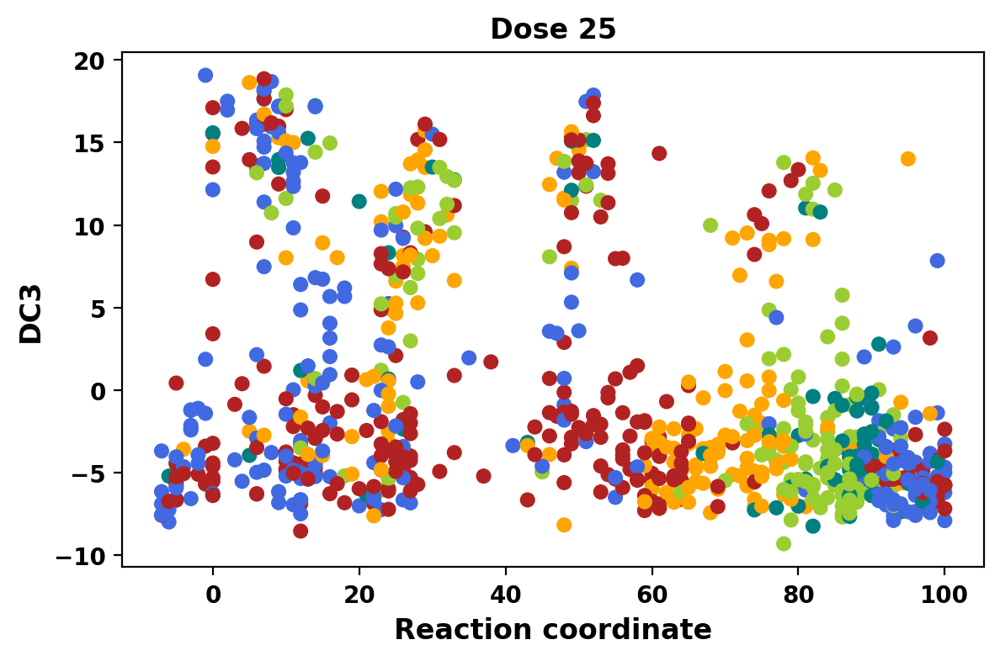

In [16]:
i=2
plt.scatter(dose_data[i]['new X'], dose_data[i]['EMT axis'], c=dose_data[i]['CC'].map(colors))
plt.xlabel('Reaction coordinate',fontsize=12,fontweight='bold')
plt.ylabel('DC3',fontsize=12,fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.margins(0.05)
plt.title('Dose ' + str(doses[i]), fontsize=12,fontweight='bold')
plt.tight_layout()
#plt.savefig("plots/reaction_coordinate/low_dose_reaction_coordinate.png", transparent=True, dpi=300)

# Process 25 pM tgfb treated cells

In [17]:
dose25 = adata_list[2][dose_data[2].index,:]
dose25.obsm['X_RC'] = np.array(dose25_df.reindex(dose25.obs.index))

In [18]:
dose25.obsm['X_DC'] = np.array(dose_data[2][['DC1','DC2','DC3','DC4','DC5','DC6','DC7','DC8','DC9','DC10']].reindex(dose25.obs.index))

In [21]:
dyn.pp.recipe_monocle(dose25, keep_filtered_genes=True)

|-----> apply Monocole recipe to adata...
|-----> <insert> pp to uns in AnnData Object.
|-----------> <insert> has_splicing to uns['pp'] in AnnData Object.
|-----------> <insert> has_labling to uns['pp'] in AnnData Object.
|-----------> <insert> splicing_labeling to uns['pp'] in AnnData Object.
|-----------> <insert> has_protein to uns['pp'] in AnnData Object.
|-----> ensure all cell and variable names unique.
|-----> ensure all data in different layers in csr sparse matrix format.
|-----> ensure all labeling data properly collapased
|-----------> <insert> tkey to uns['pp'] in AnnData Object.
|-----------> <insert> experiment_type to uns['pp'] in AnnData Object.
|-----? dynamo detects your data is size factor normalized and/or log transformed. If this is not right, plese set `normalized = False.
|-----> filtering cells...
|-----> filtering genes...
|-----> calculating size factor...
|-----> selecting genes...
|-----> <insert> frac to var in AnnData Object.
|-----> <insert> X_unspliced 

In [23]:
dyn.tl.dynamics(dose25, model='deterministic', cores=3)
dyn.tl.neighbors(dose25)
dyn.tl.cell_velocities(dose25, basis='RC', method='cosine', enforce=True, other_kernels_dict={'transform': 'sqrt'}, correct_density = True)
dyn.vf.VectorField(dose25, basis='RC', M=1000)

|-----> calculating first/second moments begins...


X shape:  (852, 30)
neighbors:  30
random_state:  RandomState(MT19937)
min_dist:  0.1
n_components:  2


|
|-----> [moments calculation] finished [6.4116s]
|-----> [calculating transition matrix via cosine kernel with sqrt transform.] in progress: 100.0000%
|-----> [calculating transition matrix via cosine kernel with sqrt transform.] finished [1.0830s]
|-----> [projecting velocity vector to low dimensional embedding] in progress: 100.0000%
|-----> [projecting velocity vector to low dimensional embedding] finished [0.3376s]
|-----> vectorfield calculation begins...
|-----> Retrieve X and V based on basis: RC. 
        Vector field will be learned in the RC space.
|-----> Generating high dimensional grids and convert into a row matrix.
|-----> Learning vector field with method: sparsevfc.
|-----> <insert> velocity_RC_SparseVFC to obsm in AnnData Object.
|-----> <insert> X_RC_SparseVFC to obsm in AnnData Object.
|-----> <insert> VecFld_RC to uns in AnnData Object.
|-----> <insert> control_point_RC to obs in AnnData Object.
|-----> <insert> inlier_prob_RC to obs in AnnData Object.
|-----> <i

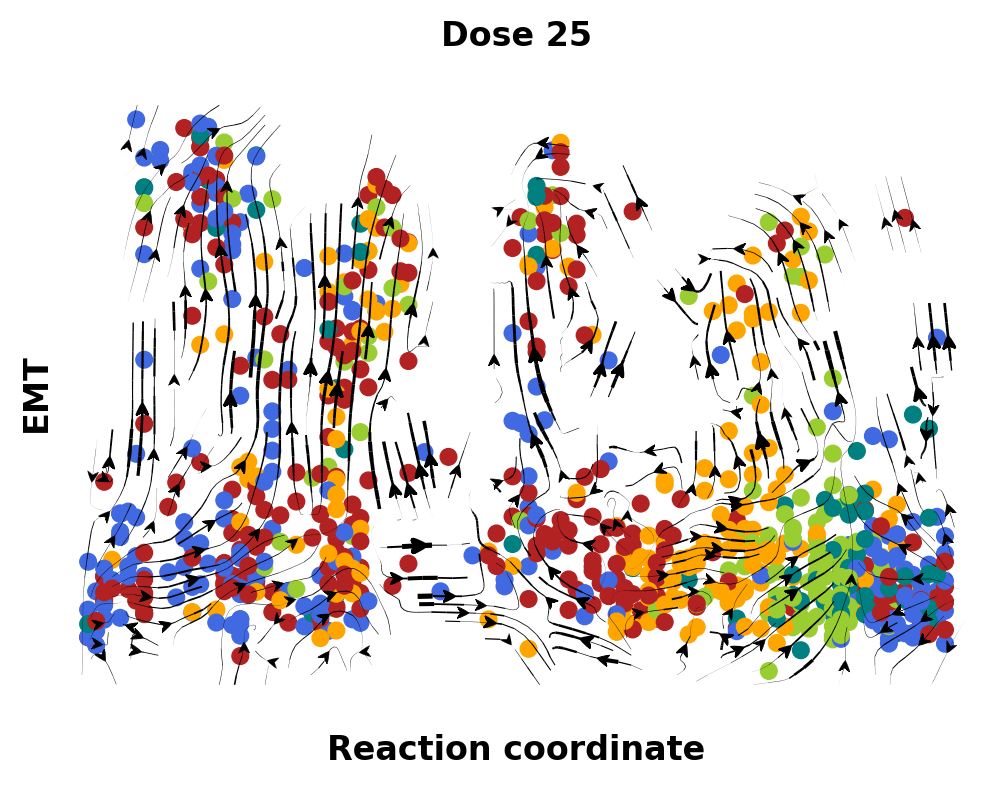

In [25]:
#plt.subplot(1,4,2)
plt.figure(figsize=(5,4))
plt.subplot(1,1,1,frame_on=False)
plt.scatter(dose25.obsm['X_RC'][:,0], dose25.obsm['X_RC'][:,1], c=dose25.obs['cell_cycle_phase'].map(colors2))
plt.title('Dose 25', fontsize=12,fontweight='bold')
plt.xlabel('Reaction coordinate',fontsize=12,fontweight='bold')
plt.ylabel('EMT',fontsize=12,fontweight='bold')
plt.xlim(-10, 103)
plt.ylim(-12, 22)
plt.xticks([])
plt.yticks([])
dyn.pl.zstreamline(dose25, basis='RC')
plt.tight_layout()
plt.savefig("../plots/dose25_indiv_CC_vf.png", dpi=300)

# Plotting gene expression

In [26]:
X_data = dose25.X.toarray()

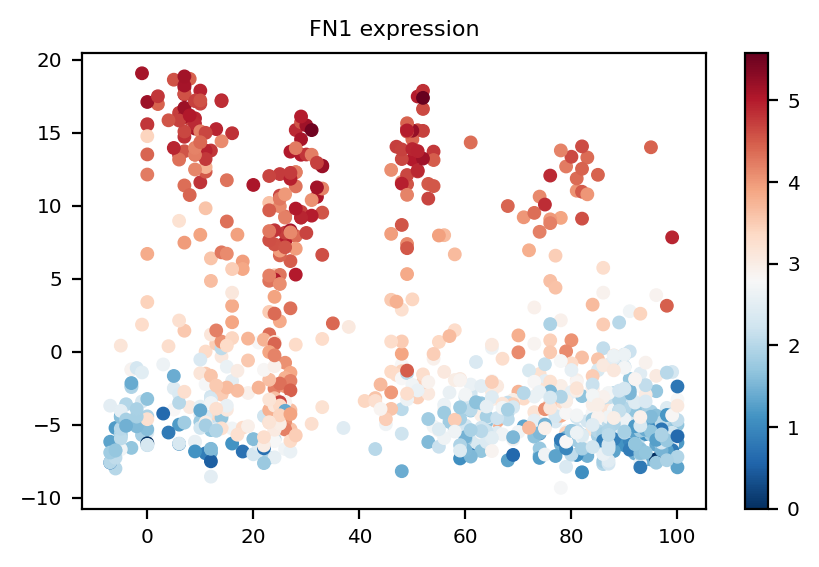

In [39]:
gene = 'FN1'
gene_index = dose25.var.index.get_loc(gene)
plt.figure(figsize=(5,3))
plt.scatter(dose25.obsm['X_RC'][:,0],
            dose25.obsm['X_RC'][:,1],
            c= X_data[:,gene_index], 
            cmap='RdBu_r',
            s=20)
plt.colorbar()
plt.title(gene + " expression")
#plt.savefig("../plots/dose25/fn1_CC_EMT.png", dpi=300)

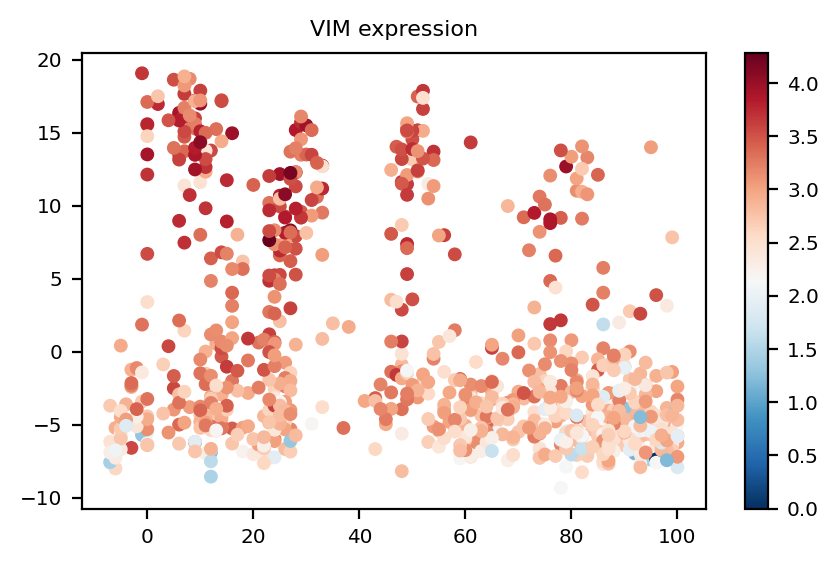

In [40]:
gene = 'VIM'
gene_index = dose25.var.index.get_loc(gene)
plt.figure(figsize=(5,3))
plt.scatter(dose25.obsm['X_RC'][:,0],
            dose25.obsm['X_RC'][:,1],
            c= X_data[:,gene_index], 
            cmap='RdBu_r',
            s=20)
plt.colorbar()
plt.title(gene + " expression")
#plt.savefig("../plots/dose25/vim_CC_EMT.png", dpi=300)

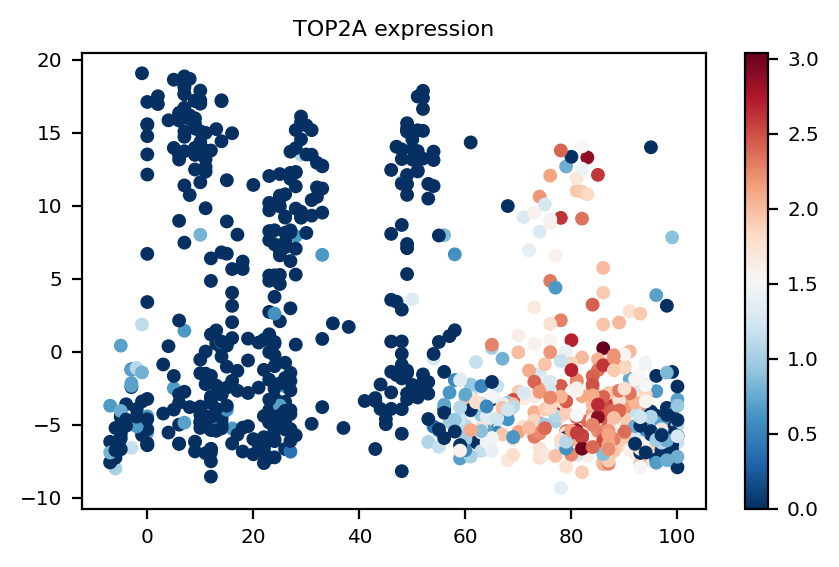

In [41]:
gene = 'TOP2A'
gene_index = dose25.var.index.get_loc(gene)
plt.figure(figsize=(5,3))
plt.scatter(dose25.obsm['X_RC'][:,0],
            dose25.obsm['X_RC'][:,1],
            c= X_data[:,gene_index], 
            cmap='RdBu_r',
            s=20)
plt.colorbar()
plt.title(gene + " expression")
#plt.savefig("../plots/dose25/top2a_CC_EMT.png", dpi=300)

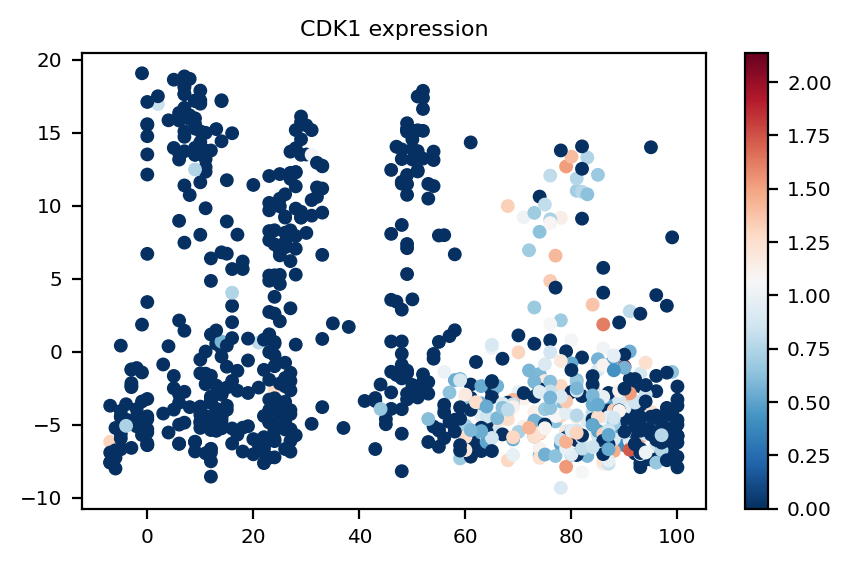

In [42]:
gene = 'CDK1'
gene_index = dose25.var.index.get_loc(gene)
plt.figure(figsize=(5,3))
plt.scatter(dose25.obsm['X_RC'][:,0],
            dose25.obsm['X_RC'][:,1],
            c= X_data[:,gene_index], 
            cmap='RdBu_r',
            s=20)
plt.colorbar()
plt.title(gene + " expression")
#plt.savefig("../plots/dose25/cdk1_CC_EMT.png", dpi=300)

# Trajectory simulations

In [32]:
P = corr_kernel(dose25.layers['X_spliced'].A.astype(np.float64), 
                dose25.layers['velocity_S'].A, 
                dose25.uns['neighbors']['indices'])

T = np.exp(-P)
T[T==1] = 0
T = T/T.sum(axis=1,keepdims=1)
np.sum(T, axis=1)

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1.

In [33]:
start_pos = list(np.where(dose25.obsm['X_RC'][:,1] < -2.5)[0])
targets = list(np.where(dose25.obsm['X_RC'][:,1] > 10)[0])

([], [])

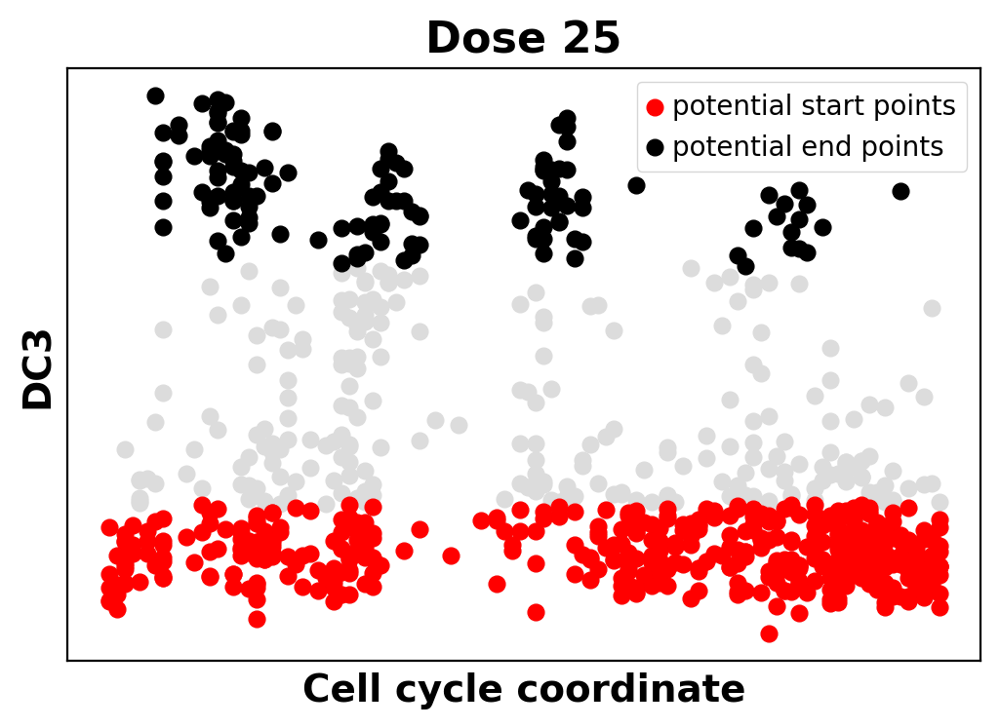

In [34]:
plt.scatter(dose25.obsm['X_RC'][:,0],
            dose25.obsm['X_RC'][:,1],
            color='gainsboro')
plt.scatter(dose25.obsm['X_RC'][start_pos,0],
            dose25.obsm['X_RC'][start_pos,1],
            color='red',
            label='potential start points')
plt.scatter(dose25.obsm['X_RC'][targets,0],
            dose25.obsm['X_RC'][targets,1],
            color='black',
            label='potential end points')
plt.legend(loc='upper right', prop={'size':10})
plt.xlabel("Cell cycle coordinate", fontsize=14, fontweight='bold')
plt.ylabel("DC3", fontsize=14, fontweight='bold')
plt.title("Dose 25", fontsize=16, fontweight='bold')
plt.xticks([])
plt.yticks([])

In [35]:
#trajs = markov_simulation(T, 1000, start_pos, targets)

In [36]:
# with open('../generated_data/dose25_trajectory_simulations/1000_trajs_adjusted.pkl', 'wb') as f:
#     pickle.dump(trajs, f)

In [ ]:
with open('../generated_data/dose25_trajectory_simulations/1000_trajs_adjusted.pkl', 'rb') as f:
    trajs = pickle.load(f)

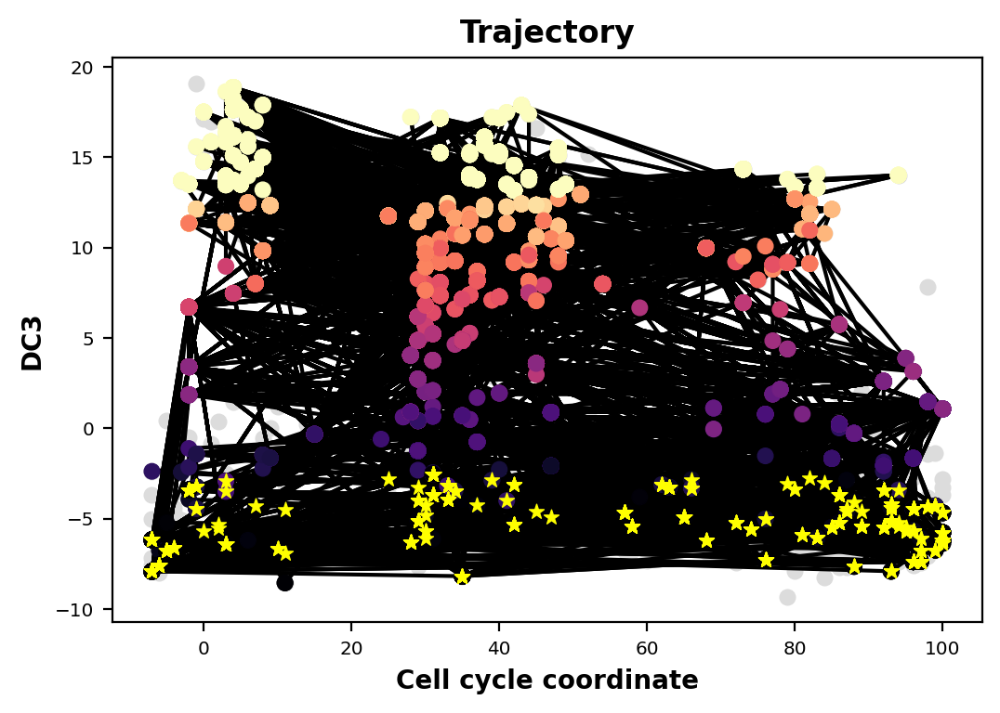

In [78]:
# Plotting the trajectories on revelio representation    
plt.scatter(dose25.obsm['X_RC'][:,0],
            dose25.obsm['X_RC'][:,1],
            color='gainsboro',
            zorder=1)
for i in range(len(trajs)):
    plt.scatter(dose25.obsm['X_RC'][trajs[i],0],
                dose25.obsm['X_RC'][trajs[i],1],
                c=dose25.obsm['X_RC'][trajs[i],1],
                cmap='magma',
                zorder=2)
    plt.plot(dose25.obsm['X_RC'][trajs[i],0],
             dose25.obsm['X_RC'][trajs[i],1],
             c='black',
             zorder=1)
    plt.scatter(dose25.obsm['X_RC'][trajs[i][0],0],
                dose25.obsm['X_RC'][trajs[i][0],1],
                marker='*',
                color='yellow',
                zorder=3)
plt.xlabel("Cell cycle coordinate", fontsize=10, fontweight='bold')
plt.ylabel("DC3", fontsize=10, fontweight='bold')
plt.title("Trajectory", fontsize=12, fontweight='bold')
plt.show()

In [37]:
den = sns.clustermap(distMat)

NameError: name 'distMat' is not defined

In [176]:
traj_fit = umap.UMAP(n_components=2, random_state=42)
traj_embedding = traj_fit.fit_transform(distMat)

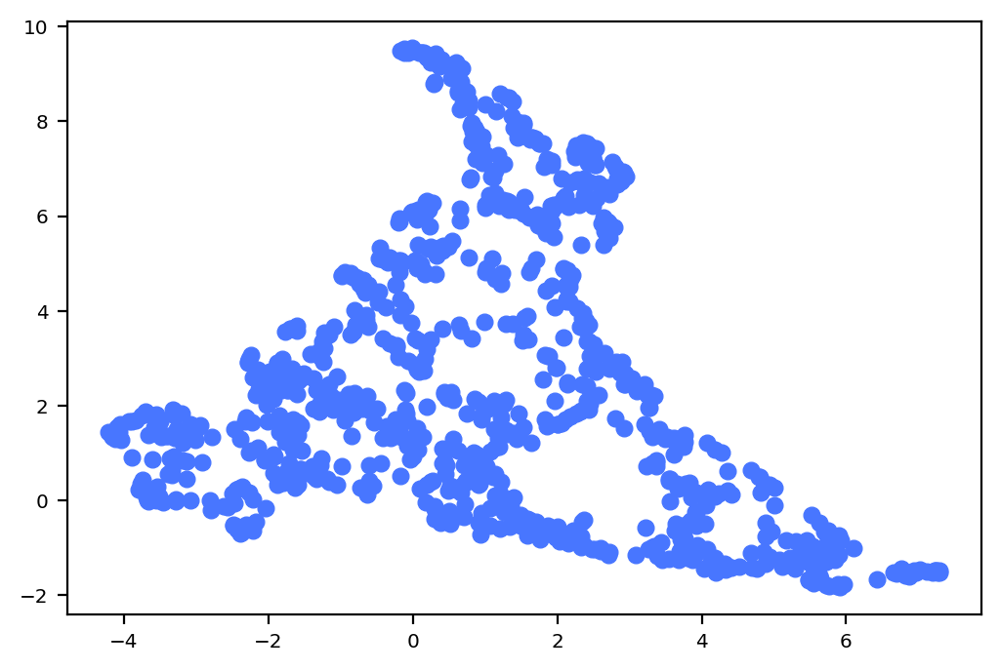

In [177]:
plt.scatter(traj_embedding[:,0],
            traj_embedding[:,1])

In [178]:
clustering = SpectralClustering(n_clusters=2,
                                assign_labels='discretize',
                                random_state=0).fit(traj_embedding)

Text(0, 0.5, 'UMAP2')

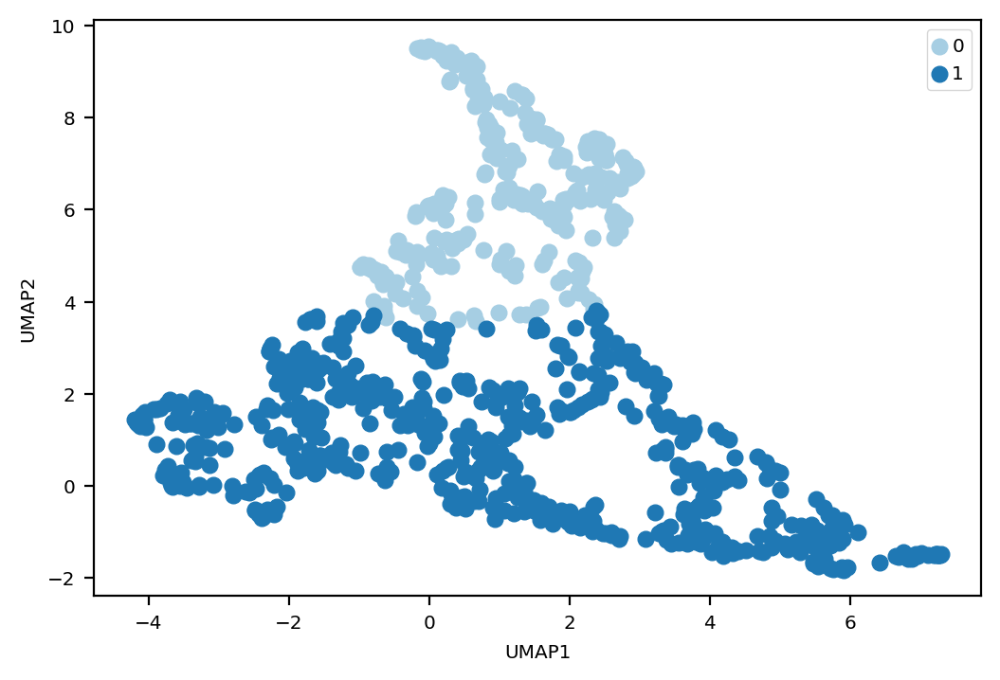

In [179]:
groups = np.unique(clustering.labels_)
cmap2 = plt.cm.get_cmap("Paired")
i=0
for group in groups:
    temp = clustering.labels_ == group
    plt.scatter(traj_embedding[temp,0],
                traj_embedding[temp,1],
                #c=clustering.labels_
                label=group,
                color=cmap2(i))
    i+=1
plt.legend()
plt.xlabel("UMAP1")
plt.ylabel('UMAP2')

In [180]:
group1 = list(np.where(clustering.labels_ == 0)[0])
group2 = list(np.where(clustering.labels_ == 1)[0])

In [181]:
coords_DC_list = []
for j in range(len(trajs)):
    coords_DC = []
    for i in range(len(trajs[j])):
        #print(trajs[j][i])
        coords_DC.append(dose25.obsm['X_DC'][trajs[j][i],:])
    coords_DC_list.append(coords_DC)

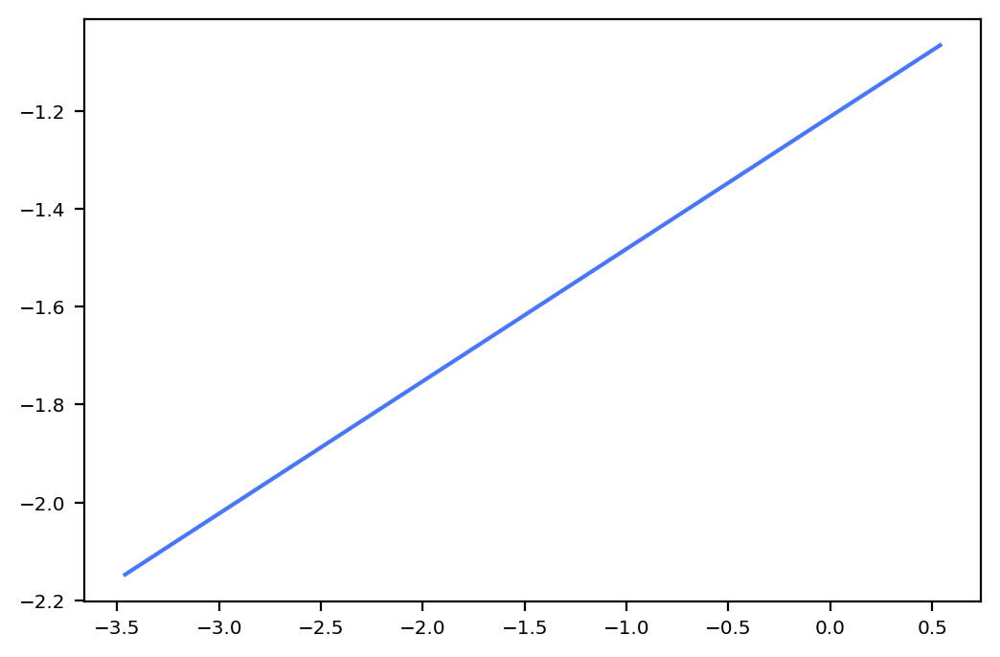

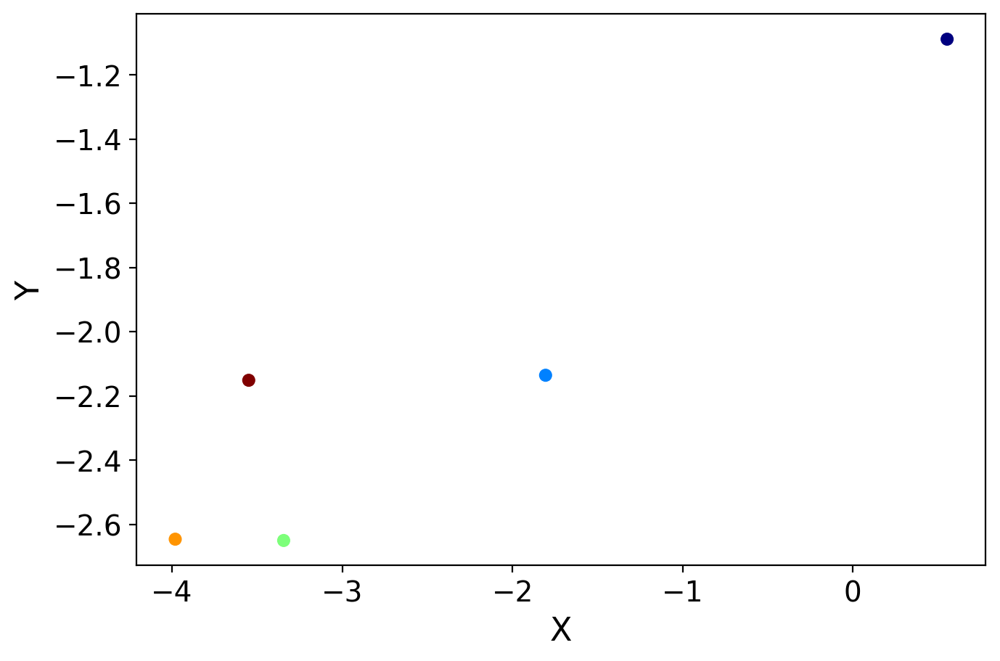

True


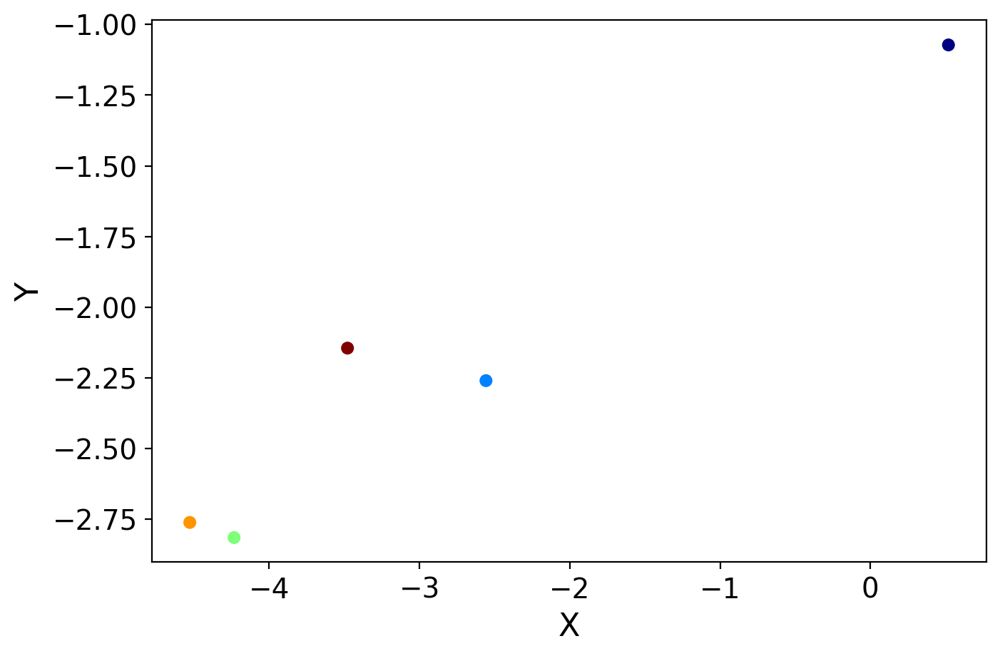

True


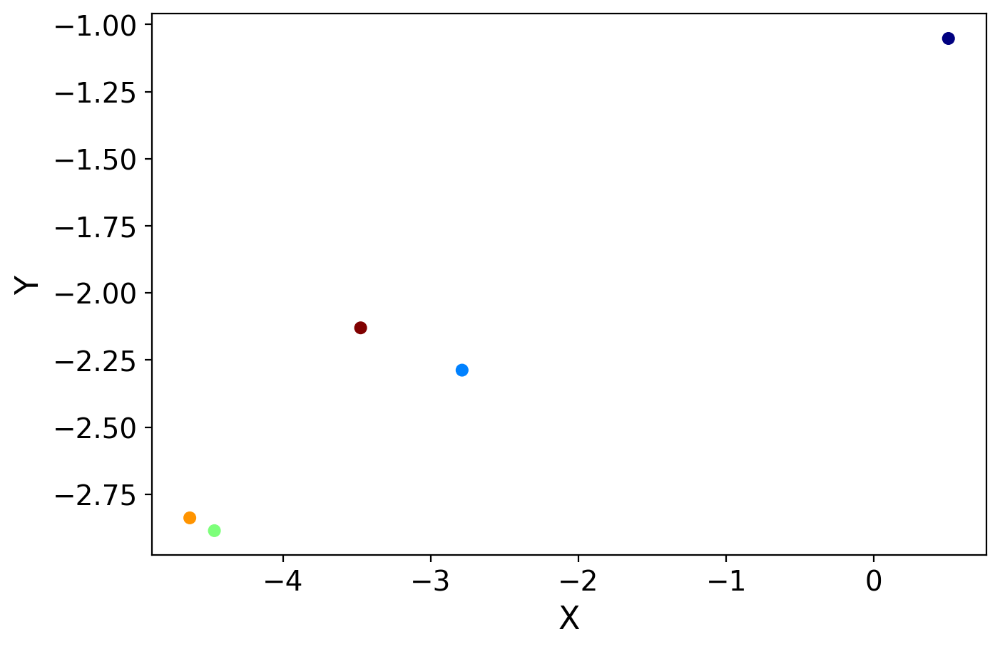

True


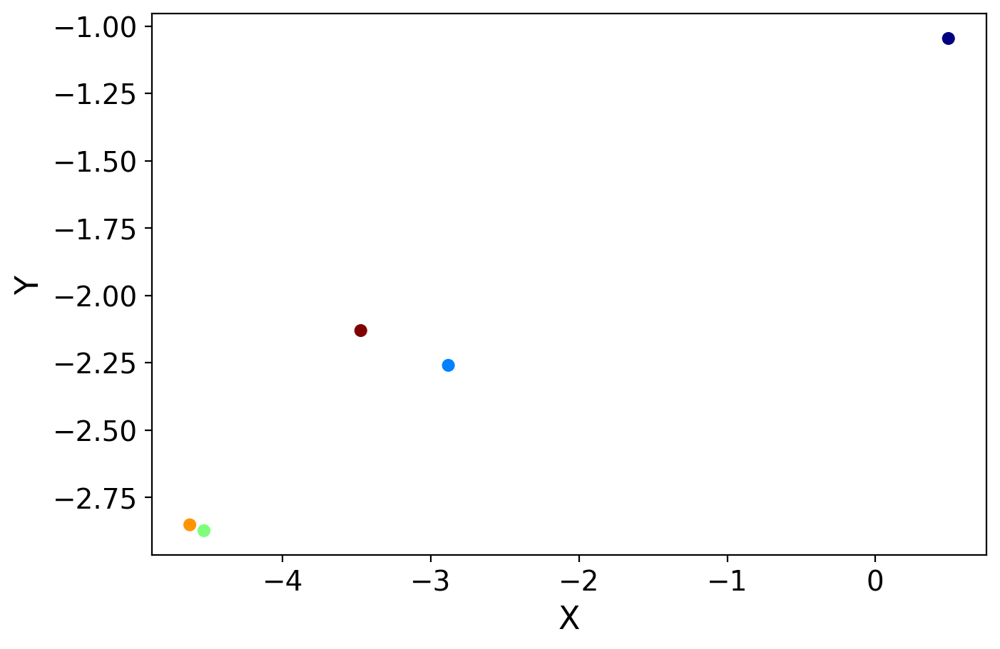

False


In [182]:
traj_cl0=[]
E_state_cl0=[]
M_state_cl0=[]
for index in group1:
    traj_arr = np.array(coords_DC_list[index])
    root_state=traj_arr[0,:]
    end_state=traj_arr[-1,:]

    traj_cl0.append(traj_arr)
    E_state_cl0.append(root_state)
    M_state_cl0.append(end_state)

E_state_mean0=np.mean(np.array(E_state_cl0),axis=0)
M_state_mean0=np.mean(np.array(M_state_cl0),axis=0)

X0=traj_cl0
x1=E_state_mean0
x2=M_state_mean0

nrc=5

FP=FindPath(nrc, traj_w=10,sf=1)
group1_traj, data_rc0=FP.fit(x1,x2,X0)

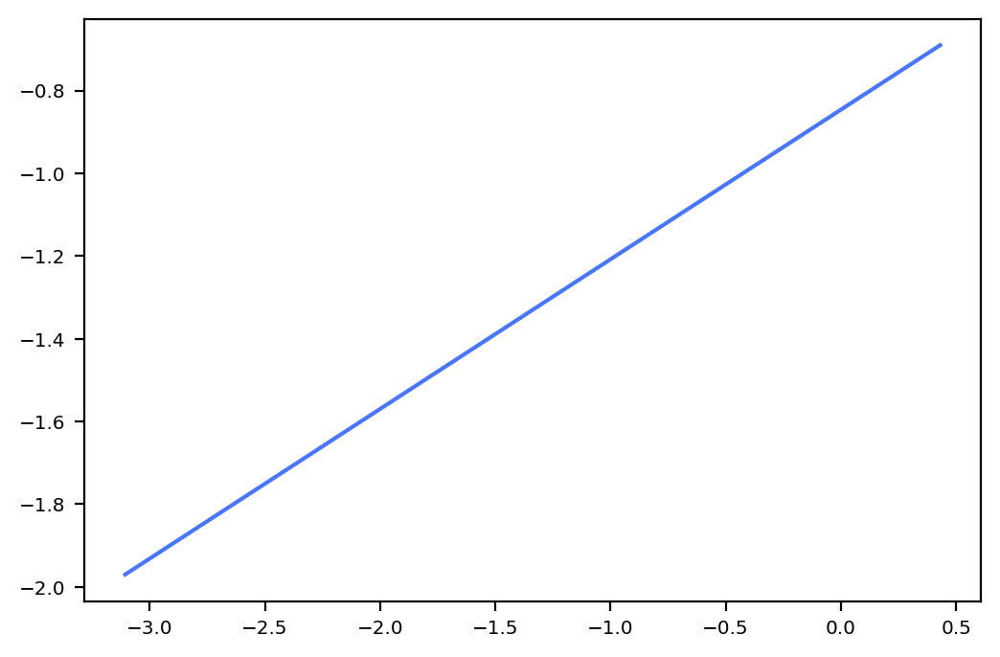

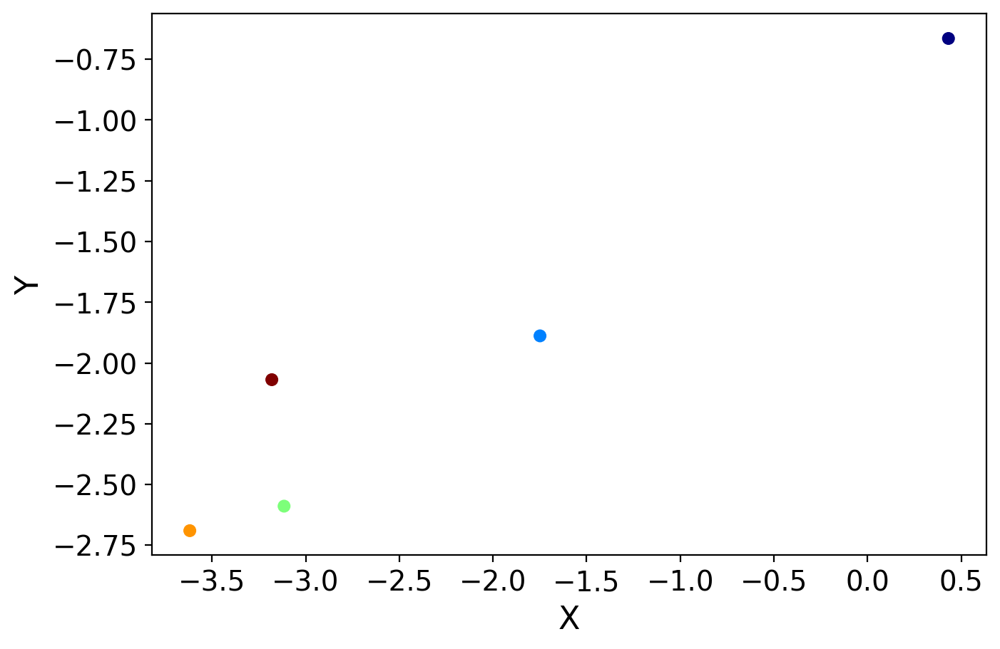

True


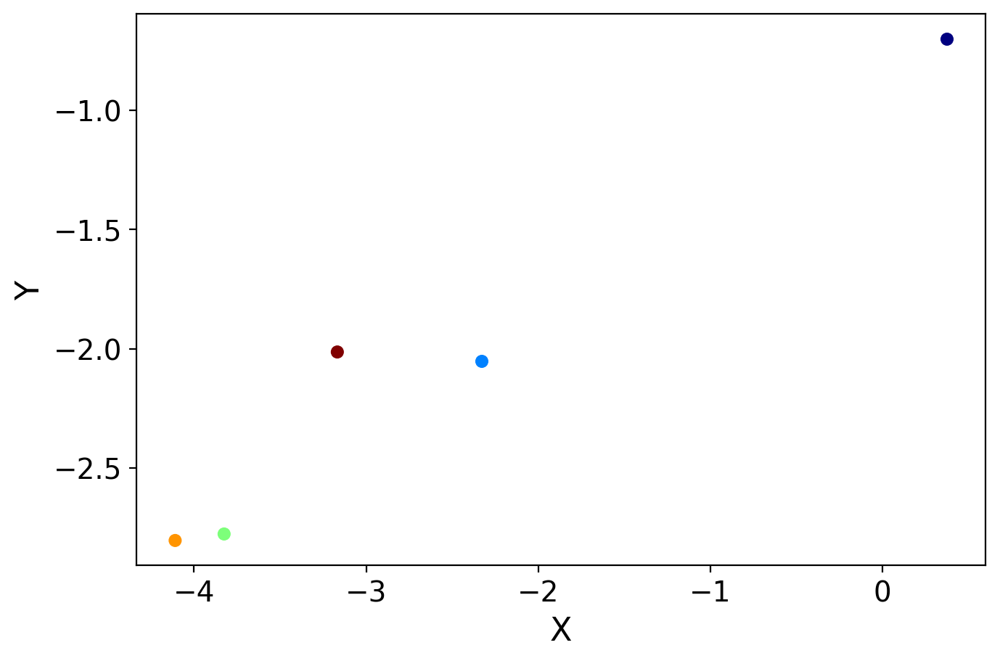

True


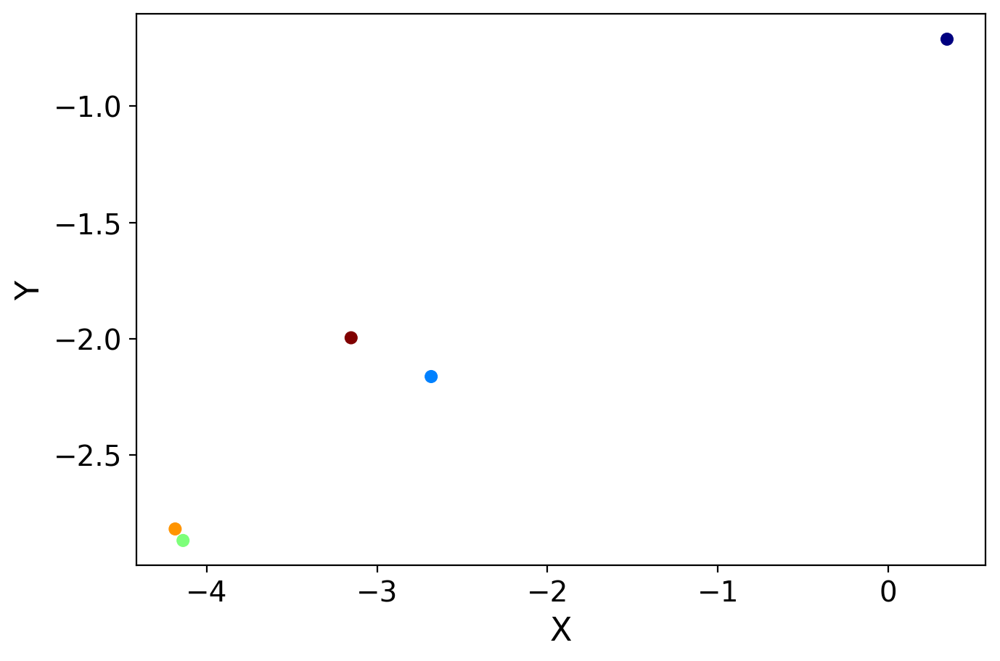

True


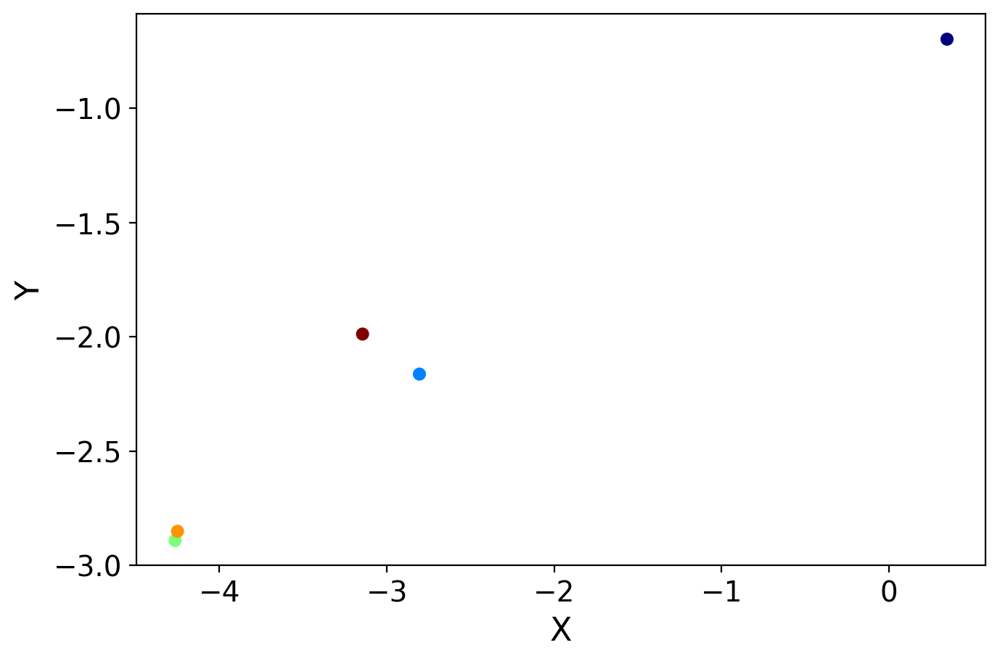

True


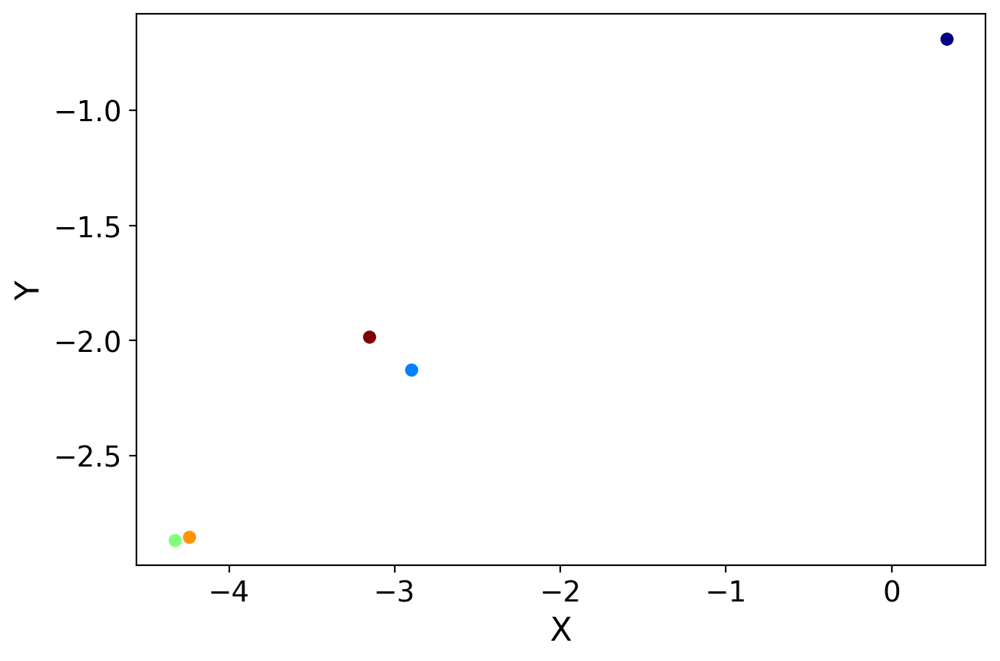

False


In [183]:
traj_cl0=[]
E_state_cl0=[]
M_state_cl0=[]
for index in group2:
    traj_arr = np.array(coords_DC_list[index])
    root_state=traj_arr[0,:]
    end_state=traj_arr[-1,:]

    traj_cl0.append(traj_arr)
    E_state_cl0.append(root_state)
    M_state_cl0.append(end_state)

E_state_mean0=np.mean(np.array(E_state_cl0),axis=0)
M_state_mean0=np.mean(np.array(M_state_cl0),axis=0)

X0=traj_cl0
x1=E_state_mean0
x2=M_state_mean0

nrc=5

FP=FindPath(nrc, traj_w=10,sf=1)
group2_traj, data_rc0=FP.fit(x1,x2,X0)

# Second path

In [225]:
second_path_indexes = []
for i in range(len(trajs)):
    start = trajs[i][0]
    end = trajs[i][-1]
    if dose25.obsm['X_RC'][start,0] > 60:
        if dose25.obsm['X_RC'][end,0] > 60:
            second_path_indexes.append(i)  

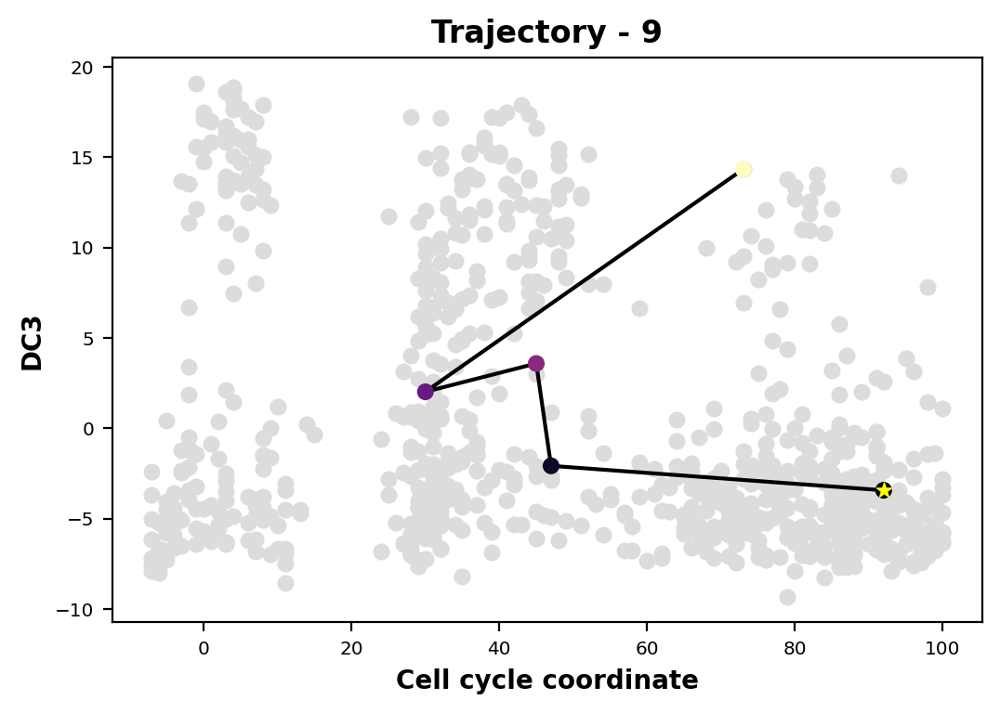

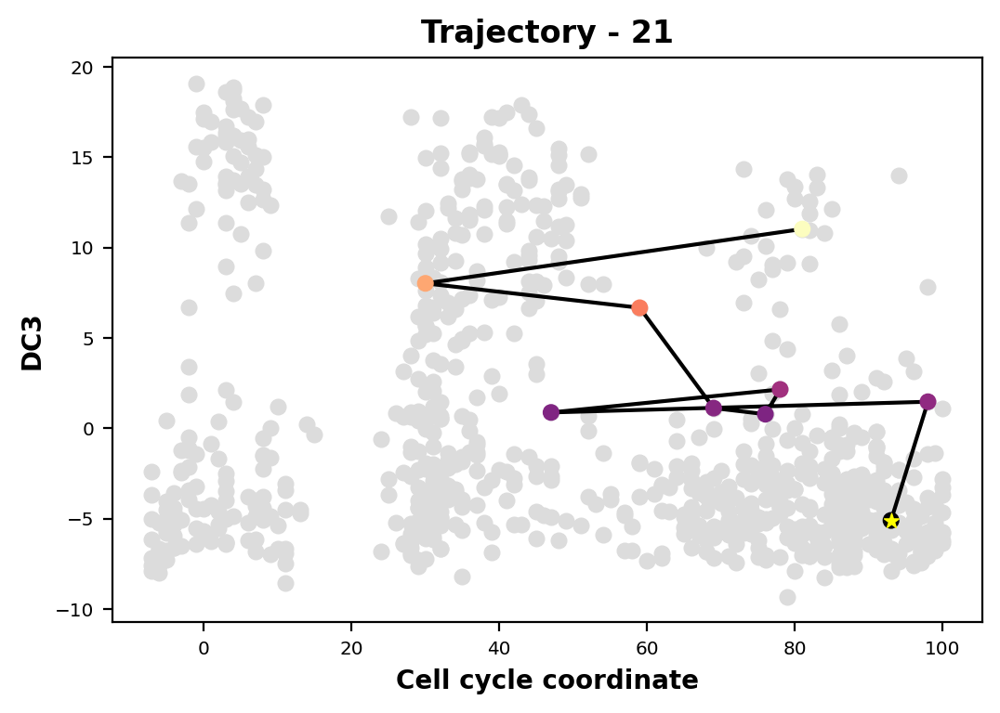

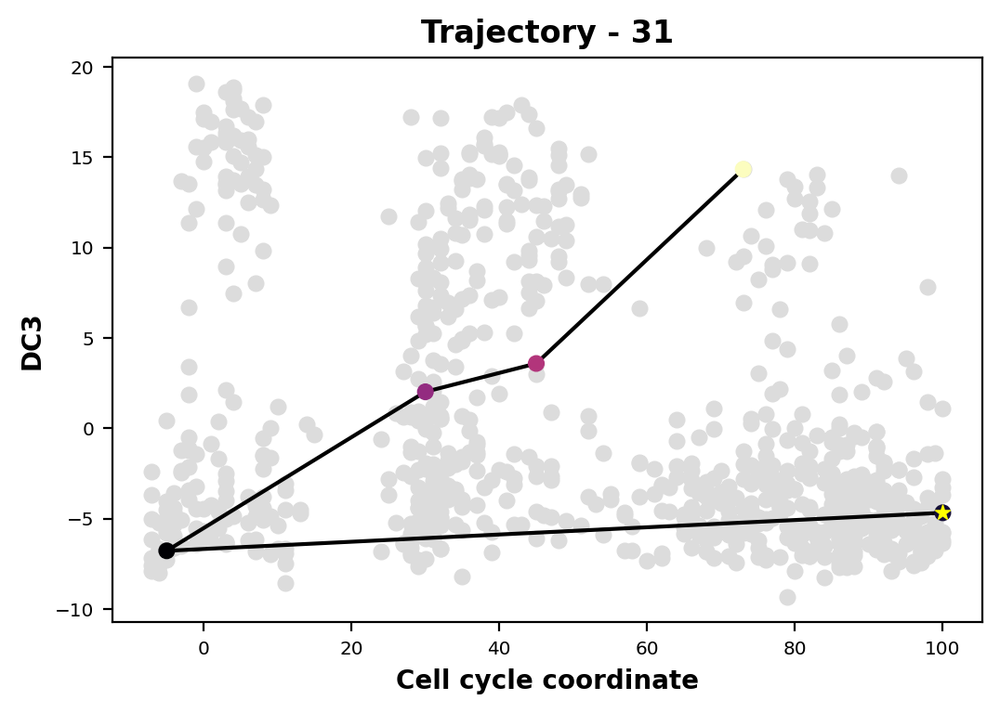

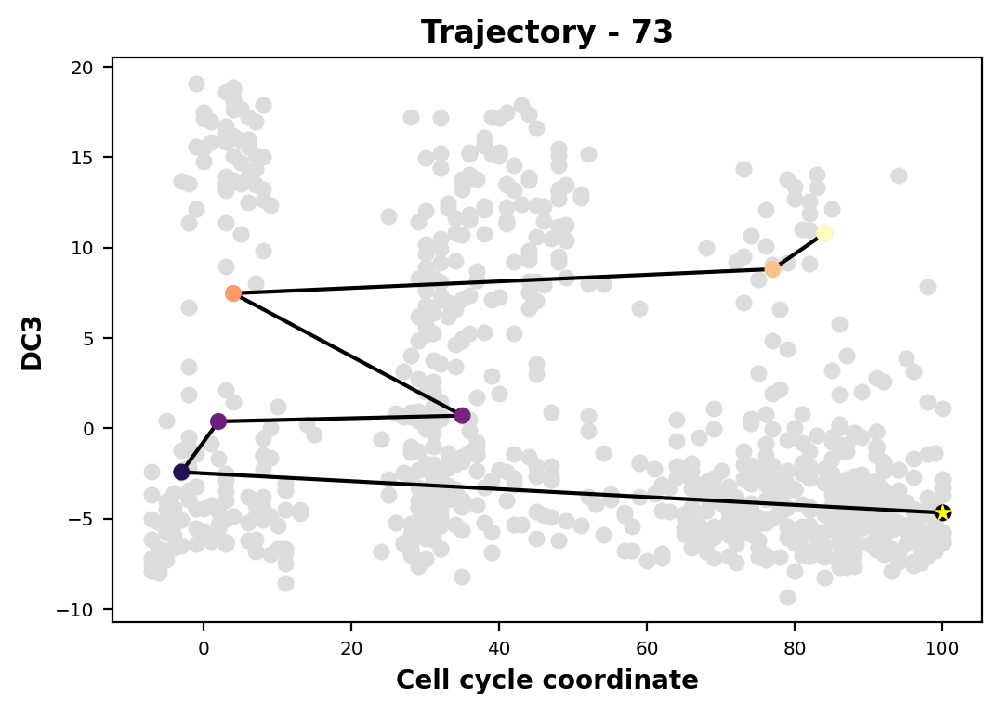

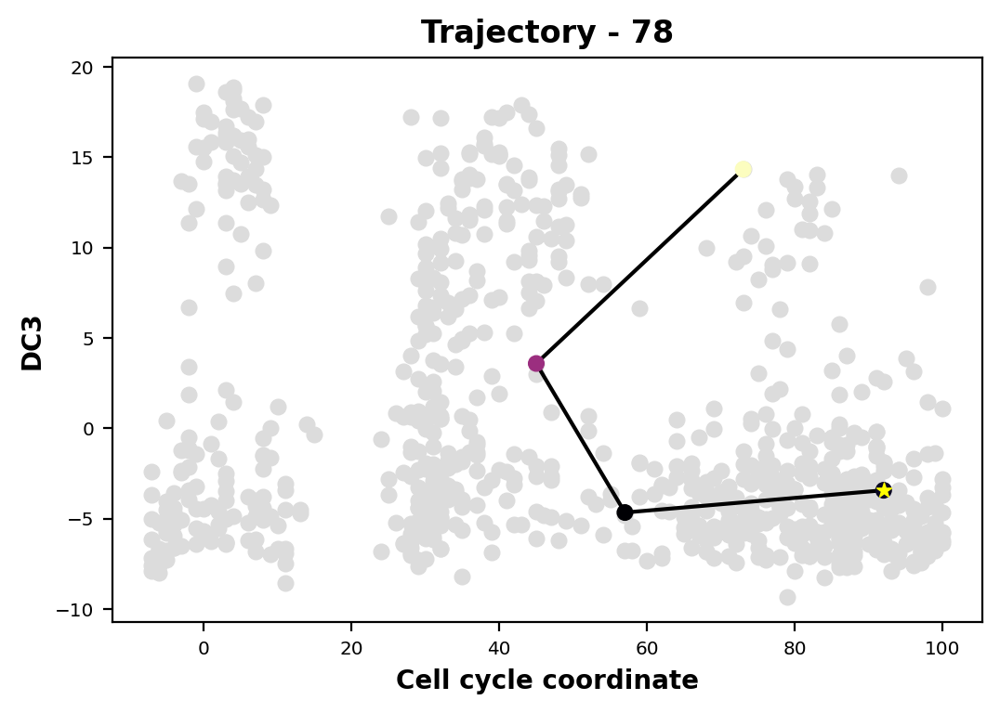

...

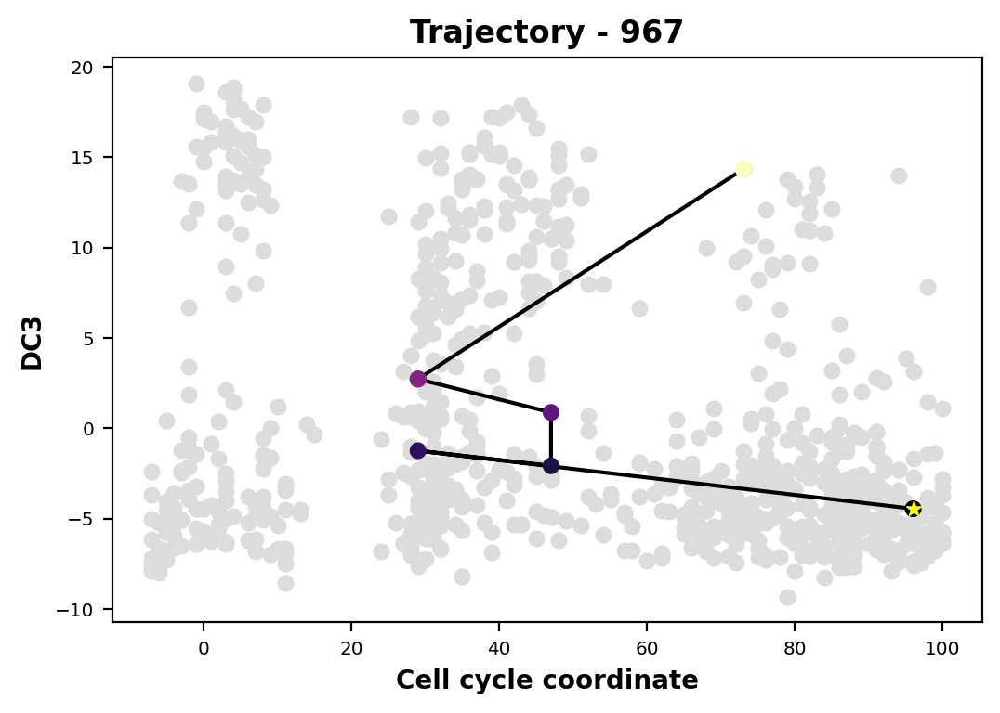

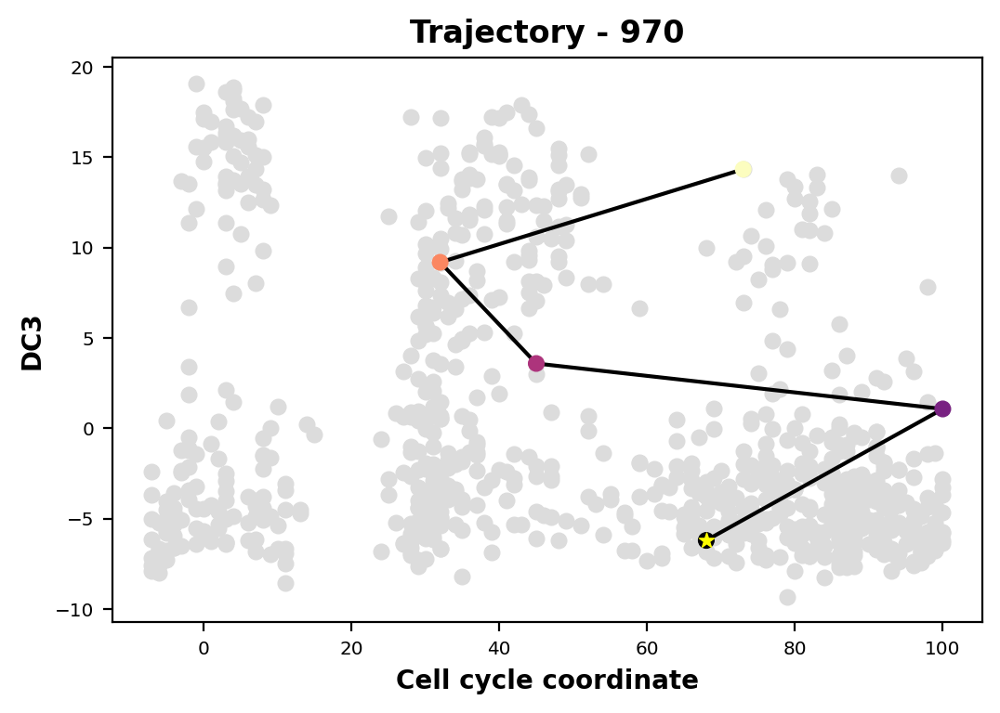

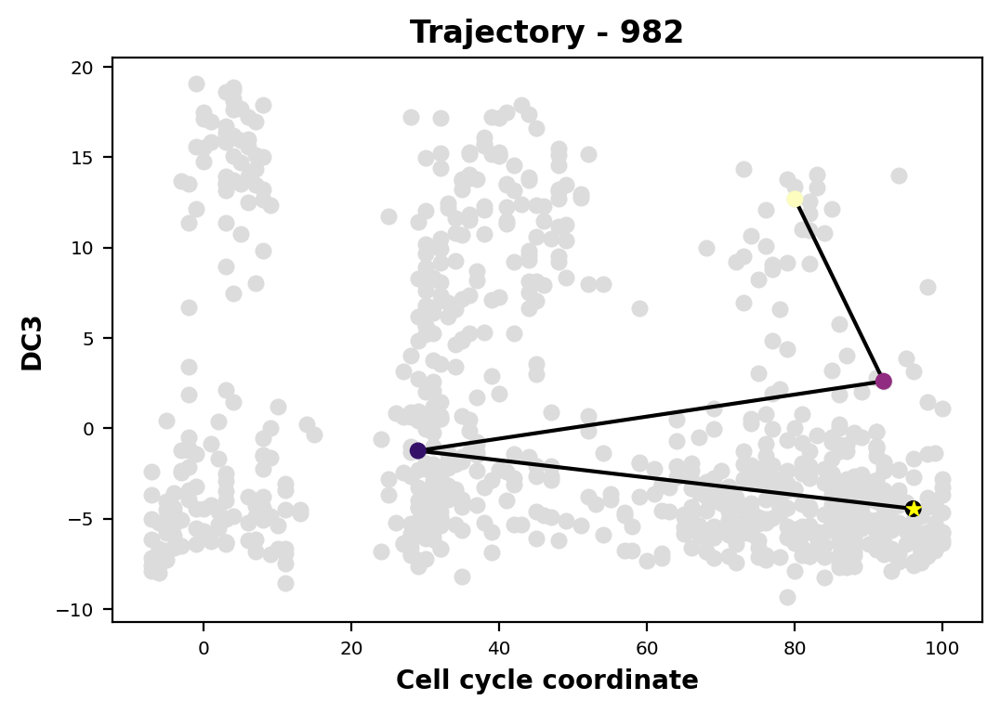

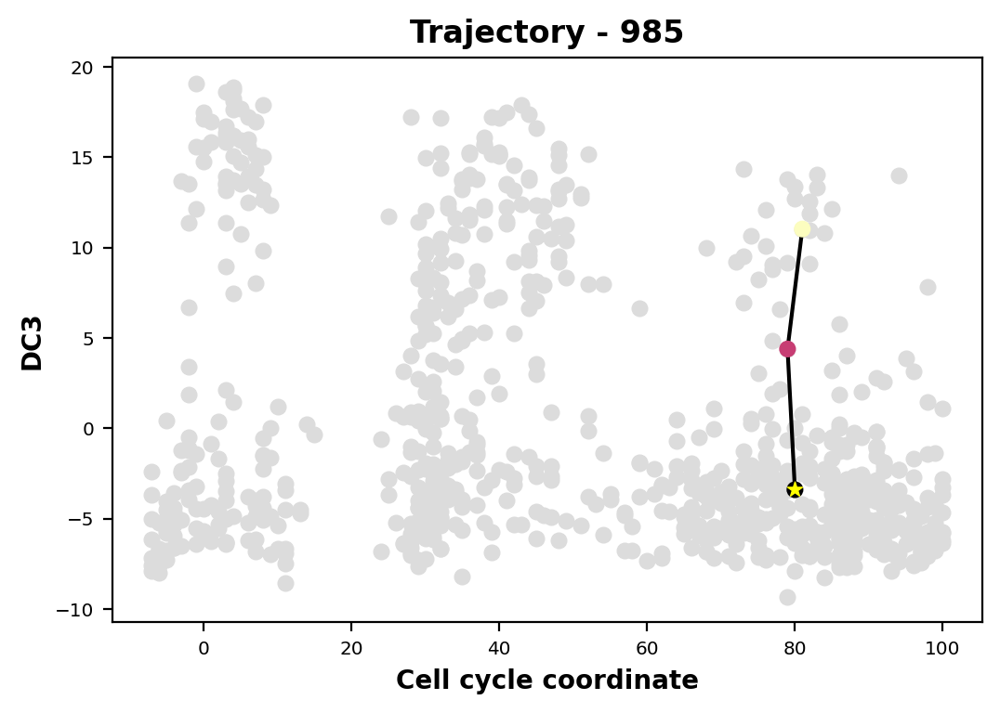

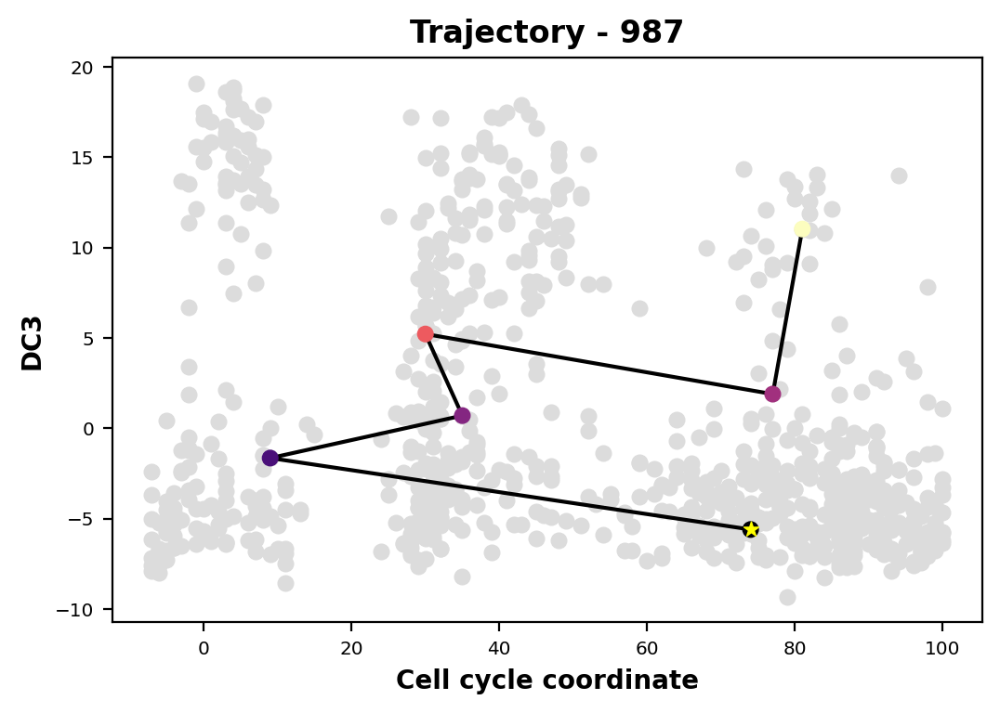

In [251]:
# Plotting the trajectories on revelio representation    
for i in second_path_indexes:
    plt.scatter(dose25.obsm['X_RC'][:,0],
                dose25.obsm['X_RC'][:,1],
                color='gainsboro',
                zorder=1)
    plt.scatter(dose25.obsm['X_RC'][trajs[i],0],
                dose25.obsm['X_RC'][trajs[i],1],
                c=dose25.obsm['X_RC'][trajs[i],1],
                cmap='magma',
                zorder=2)
    plt.plot(dose25.obsm['X_RC'][trajs[i],0],
             dose25.obsm['X_RC'][trajs[i],1],
             c='black',
             zorder=1)
    plt.scatter(dose25.obsm['X_RC'][trajs[i][0],0],
                dose25.obsm['X_RC'][trajs[i][0],1],
                marker='*',
                color='yellow',
                zorder=3)
    plt.xlabel("Cell cycle coordinate", fontsize=10, fontweight='bold')
    plt.ylabel("DC3", fontsize=10, fontweight='bold')
    plt.title("Trajectory - " + str(i), fontsize=12, fontweight='bold')
    plt.show()

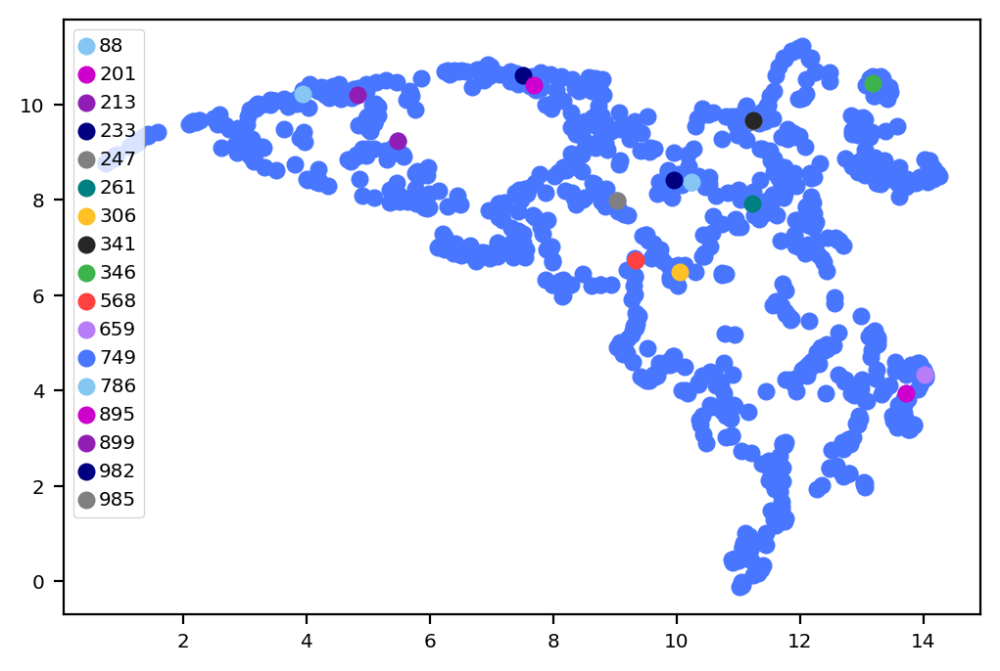

In [253]:
plt.scatter(traj_embedding[:,0],
            traj_embedding[:,1])
plt.scatter(traj_embedding[88,0],
            traj_embedding[88,1], label='88'),
plt.scatter(traj_embedding[201,0],
            traj_embedding[201,1], label='201')
plt.scatter(traj_embedding[213,0],
            traj_embedding[213,1], label='213')
plt.scatter(traj_embedding[233,0],
            traj_embedding[233,1], label='233')
plt.scatter(traj_embedding[247,0],
            traj_embedding[247,1], label='247')
plt.scatter(traj_embedding[261,0],
            traj_embedding[261,1], label='261')
plt.scatter(traj_embedding[306,0],
            traj_embedding[306,1], label='306')
plt.scatter(traj_embedding[341,0],
            traj_embedding[341,1], label='341')
plt.scatter(traj_embedding[346,0],
            traj_embedding[346,1], label='346')
plt.scatter(traj_embedding[568,0],
            traj_embedding[568,1], label='568')
plt.scatter(traj_embedding[659,0],
            traj_embedding[659,1], label='659')
plt.scatter(traj_embedding[759,0],
            traj_embedding[759,1], label='749')
plt.scatter(traj_embedding[786,0],
            traj_embedding[786,1], label='786')
plt.scatter(traj_embedding[895,0],
            traj_embedding[895,1], label='895')
plt.scatter(traj_embedding[899,0],
            traj_embedding[899,1], label='899')
plt.scatter(traj_embedding[982,0],
            traj_embedding[982,1], label='982')
plt.scatter(traj_embedding[985,0],
            traj_embedding[985,1], label='985')
plt.legend()

In [254]:
indexes = [88,201, 213, 233, 247, 261, 306, 341, 346, 568, 659, 759, 786, 895, 899, 982, 985]

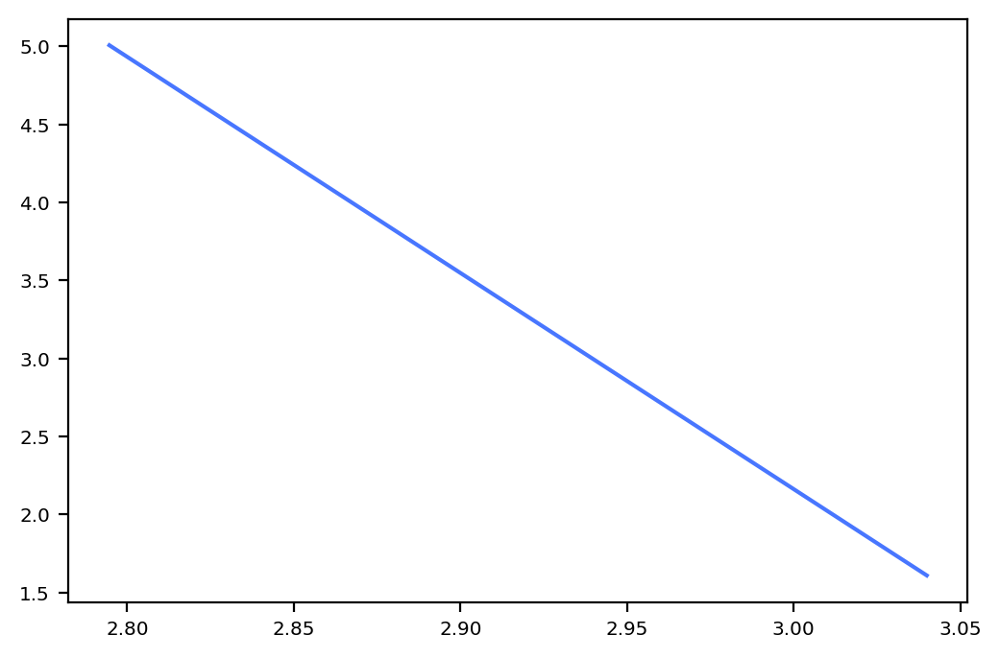

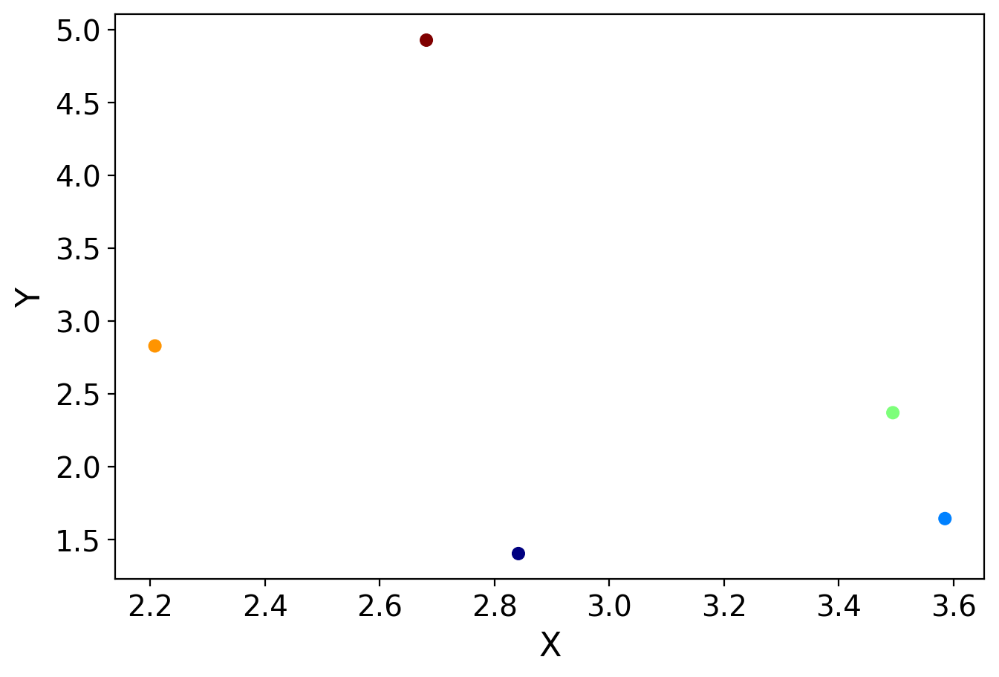

True


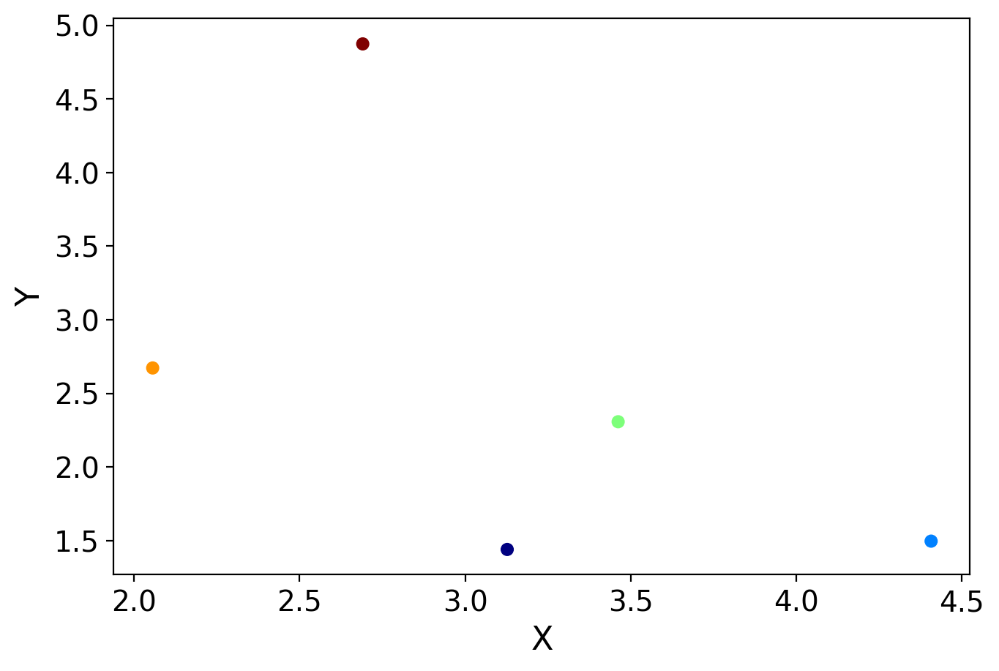

True


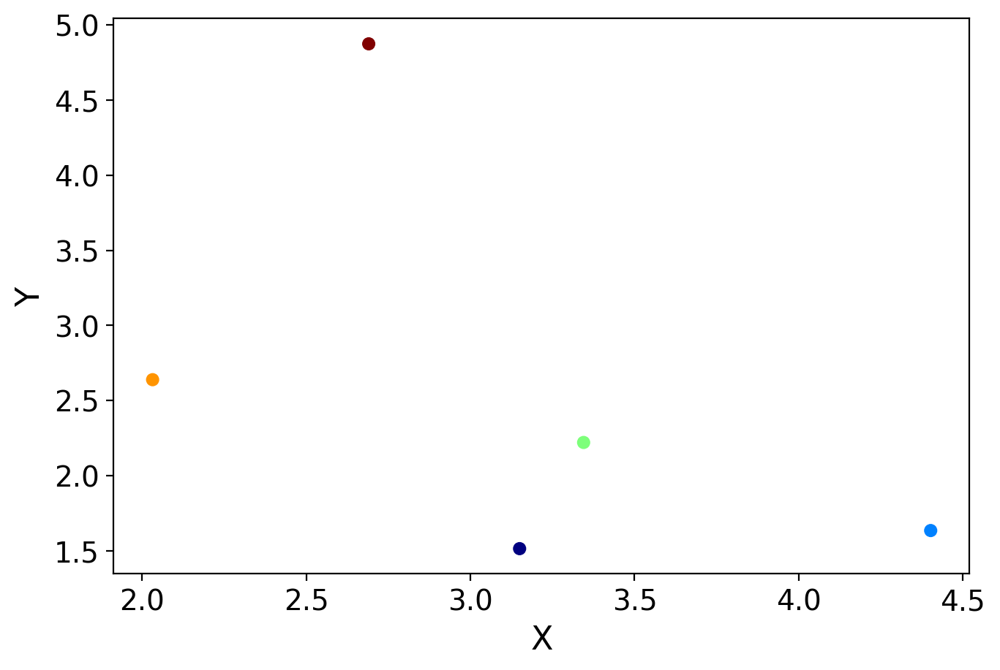

True


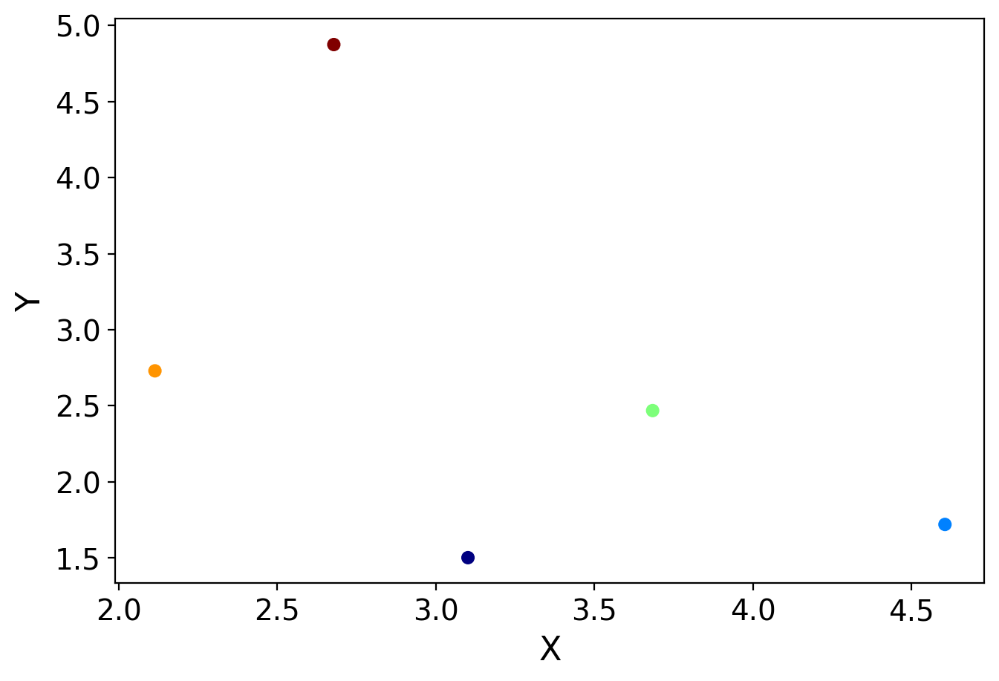

True


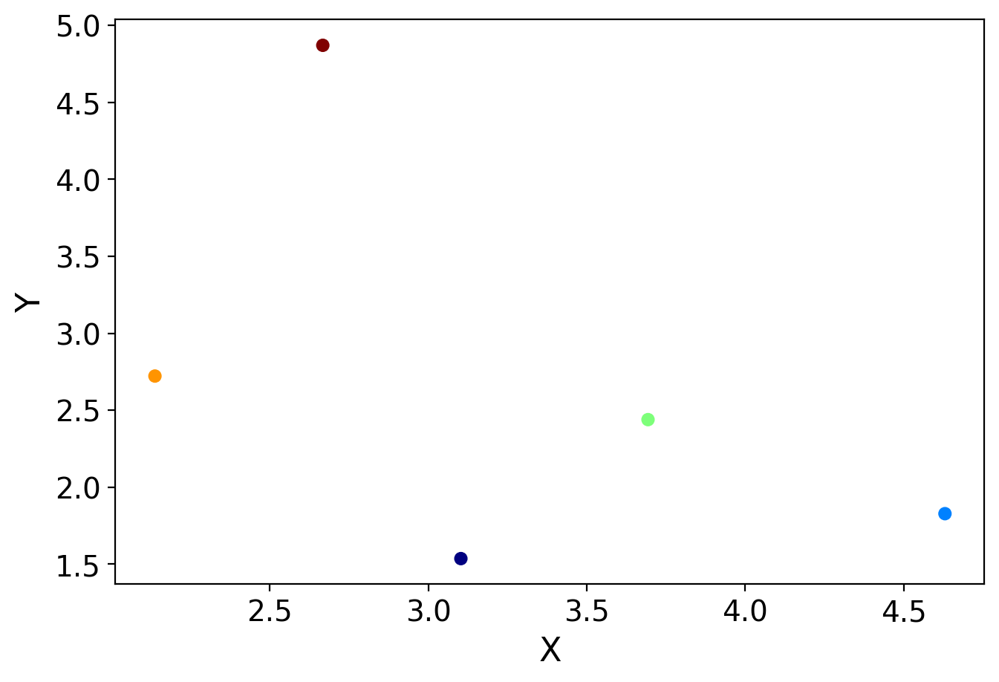

True


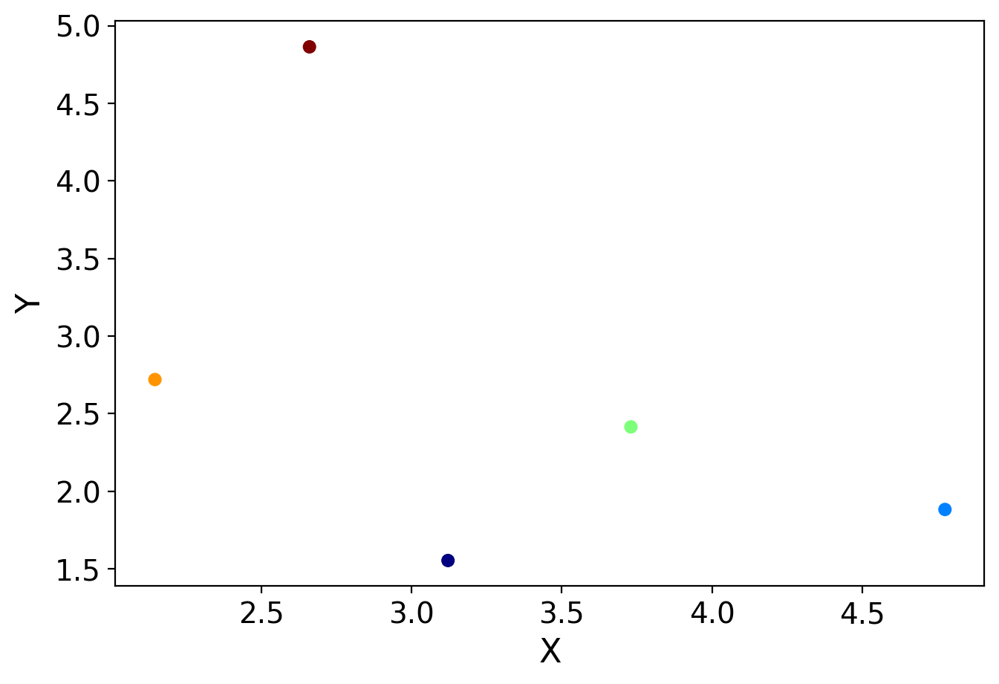

True


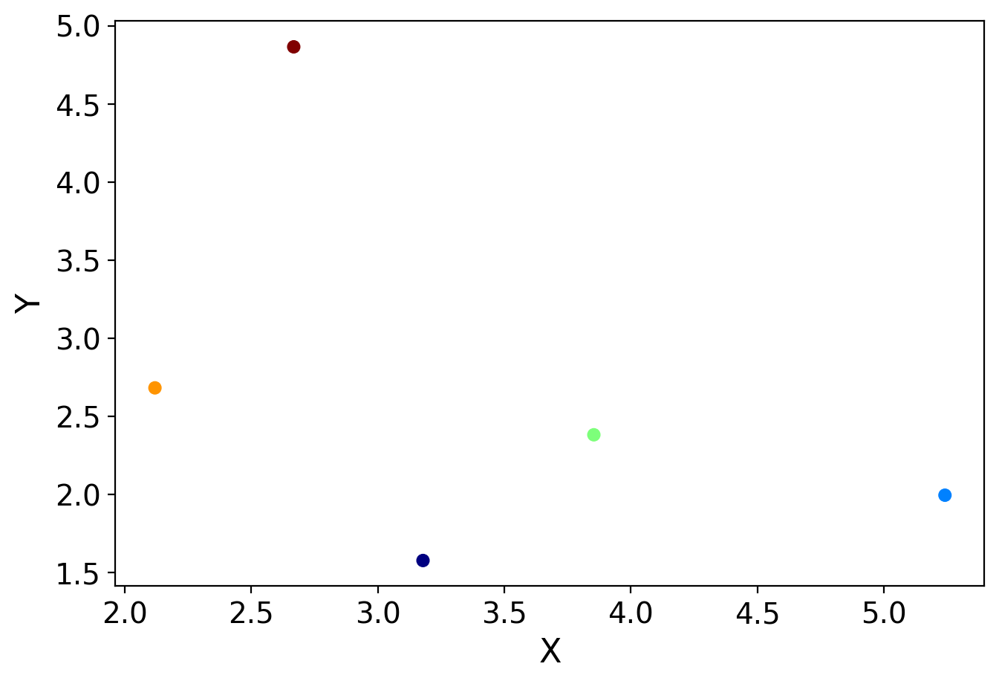

True


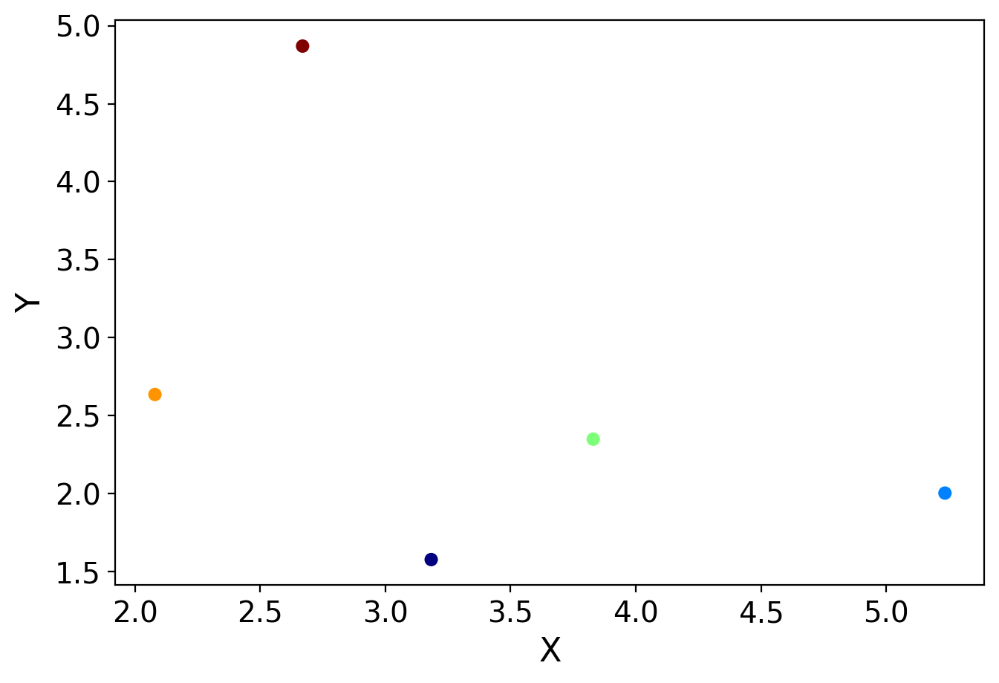

False


In [255]:
traj_cl0=[]
E_state_cl0=[]
M_state_cl0=[]
for index in indexes:
    traj_arr = np.array(coords_DC_list[index])
    root_state=traj_arr[0,:]
    end_state=traj_arr[-1,:]

    traj_cl0.append(traj_arr)
    E_state_cl0.append(root_state)
    M_state_cl0.append(end_state)

E_state_mean0=np.mean(np.array(E_state_cl0),axis=0)
M_state_mean0=np.mean(np.array(M_state_cl0),axis=0)

X0=traj_cl0
x1=E_state_mean0
x2=M_state_mean0

nrc=5

FP=FindPath(nrc, traj_w=10,sf=1)
second_path_traj, data_rc0=FP.fit(x1,x2,X0)

In [256]:
second_path_traj_df = pd.DataFrame(second_path_traj, columns=['DC1','DC2','DC3','DC4','DC5','DC6','DC7','DC8','DC9','DC10'])
second_path_traj_df = helper_functions.assignPointsToReactionCoordinate(second_path_traj_df, xi, yi)

In [257]:
temp = copy.deepcopy(second_path_traj_df['RC nneighbor '])
temp[temp > 100] = temp[temp > 100] - np.max(dose25.obsm['X_RC'][:,0])
second_path_traj_df['RC_adjusted'] = temp

([], [])

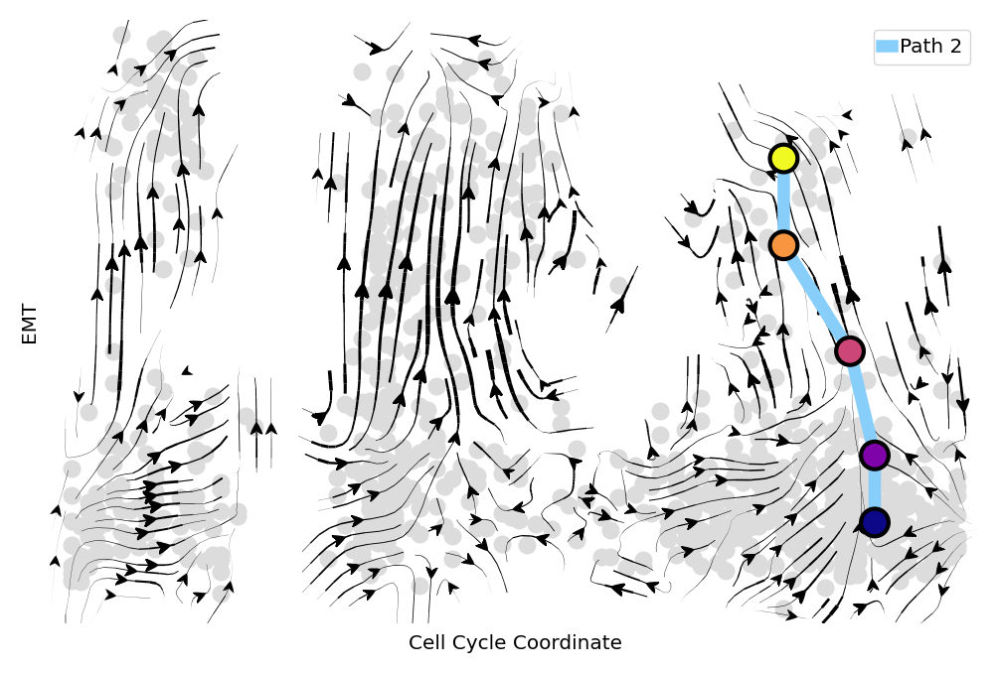

In [265]:
plt.subplot(1,1,1, frame_on=False)
plt.scatter(dose25.obsm['X_RC'][:,0],
            dose25.obsm['X_RC'][:,1],
            c='gainsboro', zorder=1)
dyn.pl.zstreamline(dose25, basis='RC', zorder=2)
plt.plot(second_path_traj_df['RC_adjusted'], second_path_traj_df['DC3'], 'lightskyblue', zorder=3, linewidth=4.5, label='Path 2')
plt.scatter(second_path_traj_df['RC_adjusted'], second_path_traj_df['DC3'], c=range(5), cmap='plasma', zorder=4, edgecolors='k', linewidth=1.5, s=100)
plt.legend()
plt.xlabel("Cell Cycle Coordinate")
plt.ylabel("EMT")
plt.xticks([])
plt.yticks([])
#plt.savefig("../plots/1000_trajs/umap_2_clusters_paths.png", dpi=300)

# First path

In [270]:
first_indexes = set(np.arange(1000)) - set(indexes)

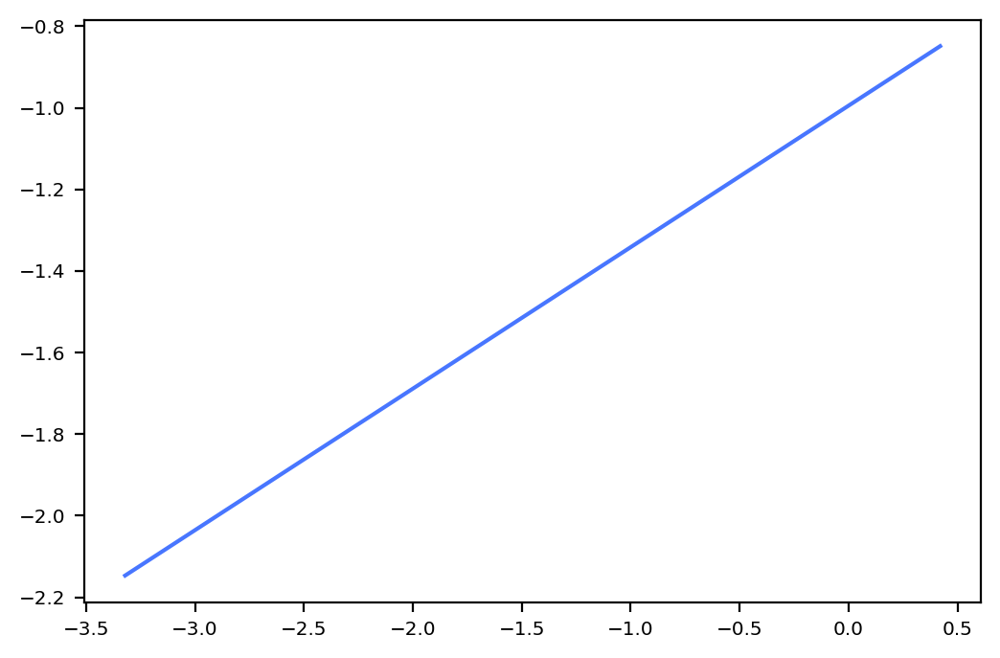

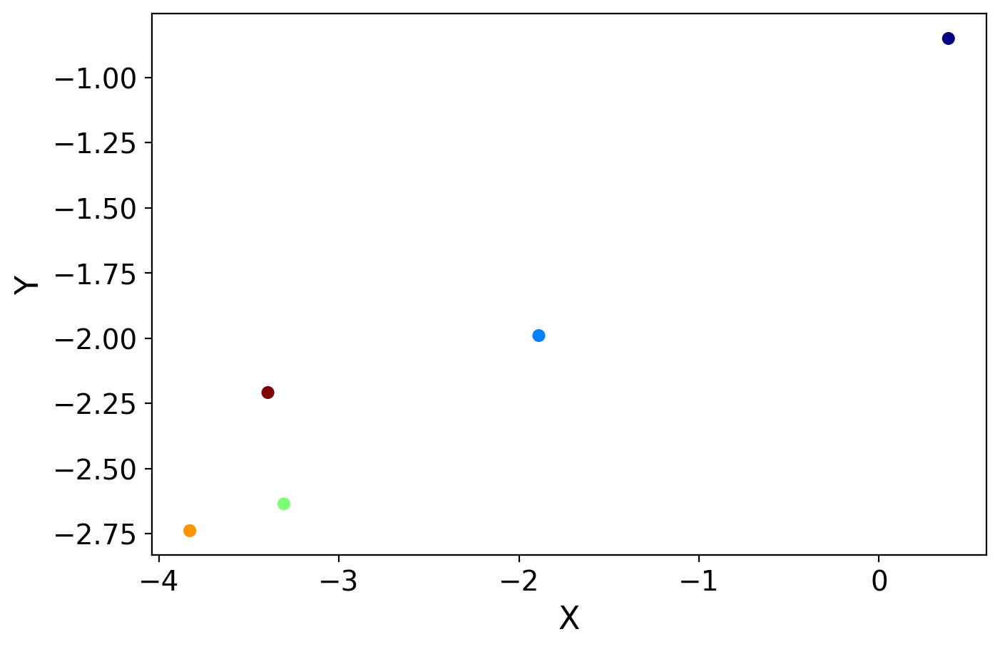

True


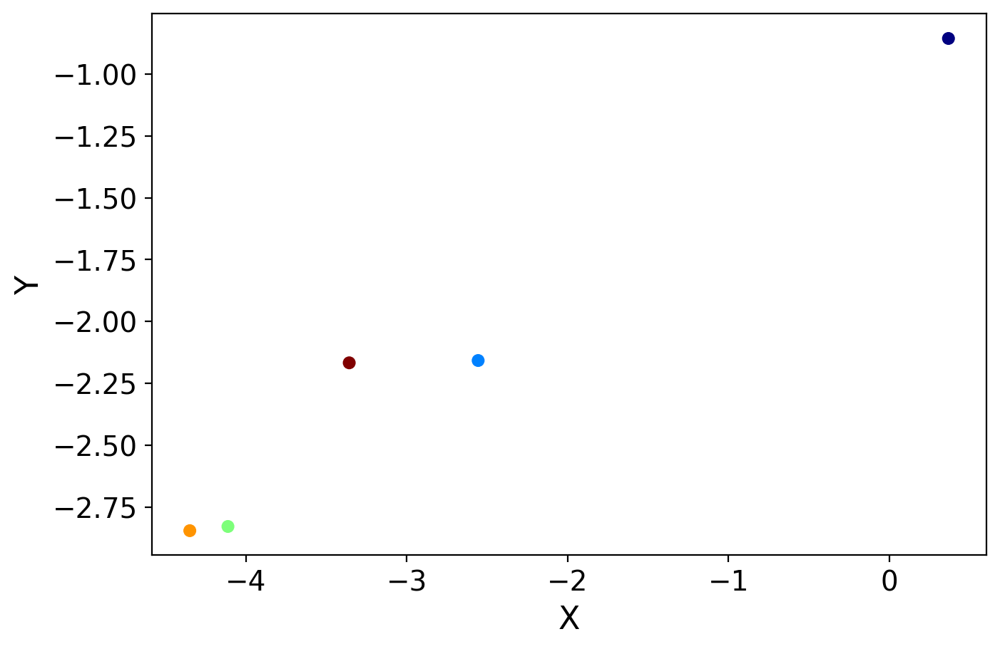

True


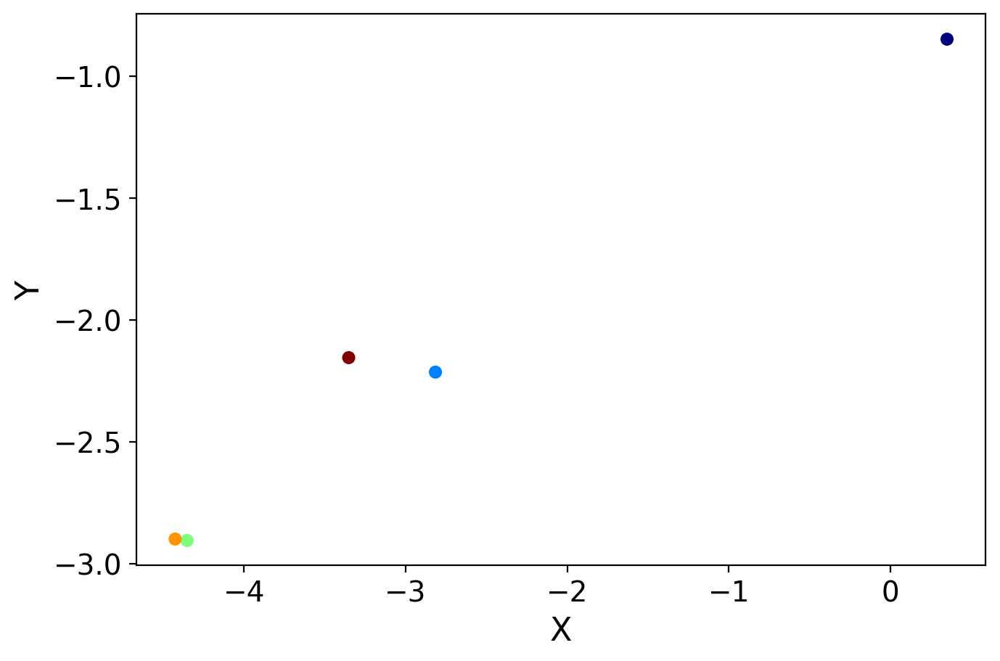

True


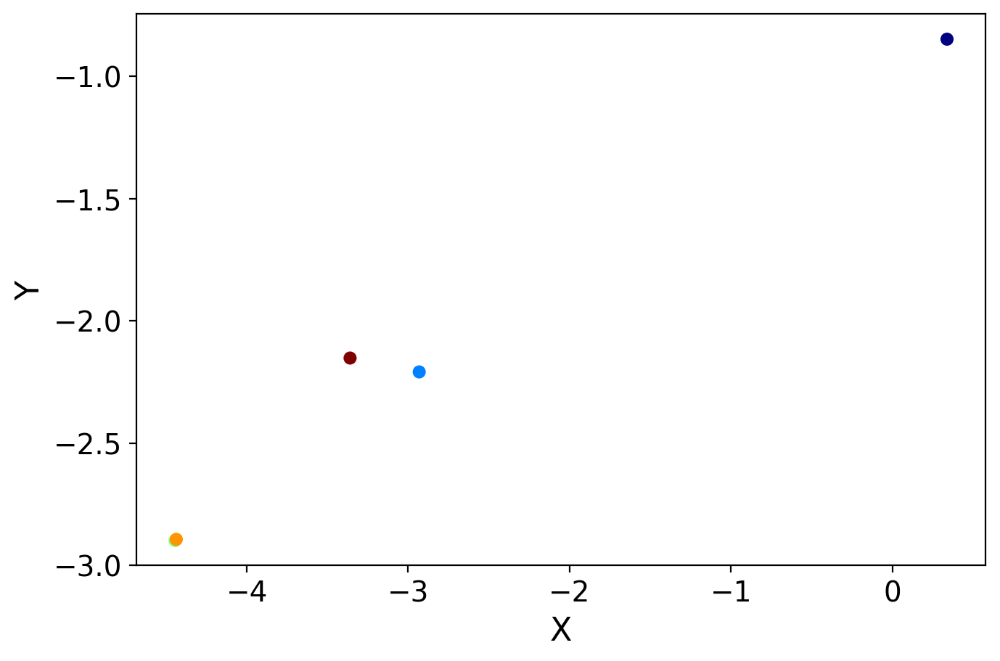

True


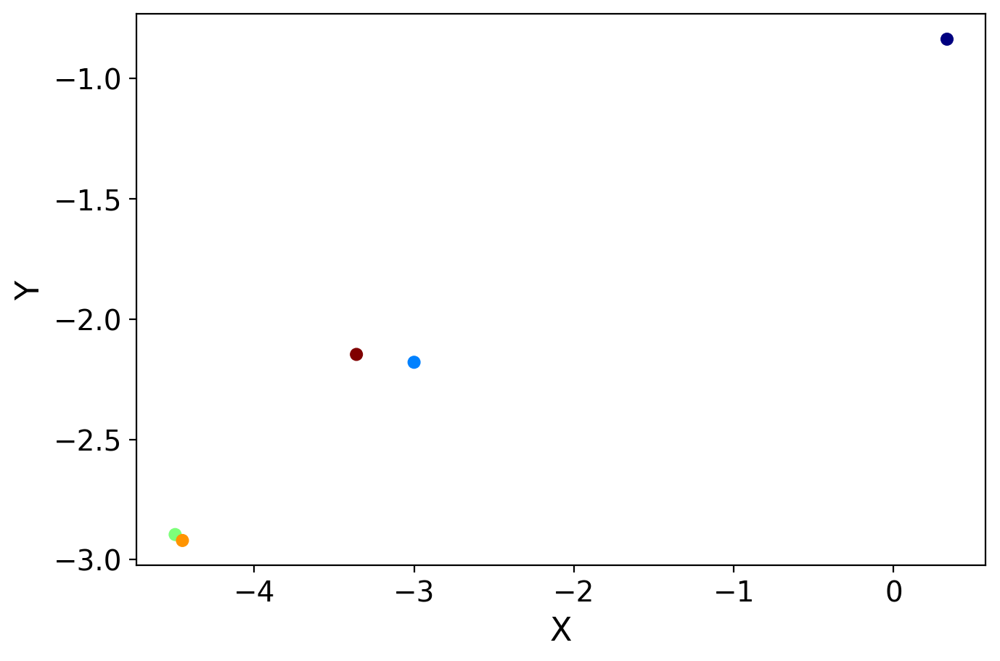

False


In [271]:
traj_cl0=[]
E_state_cl0=[]
M_state_cl0=[]
for index in first_indexes:
    traj_arr = np.array(coords_DC_list[index])
    root_state=traj_arr[0,:]
    end_state=traj_arr[-1,:]

    traj_cl0.append(traj_arr)
    E_state_cl0.append(root_state)
    M_state_cl0.append(end_state)

E_state_mean0=np.mean(np.array(E_state_cl0),axis=0)
M_state_mean0=np.mean(np.array(M_state_cl0),axis=0)

X0=traj_cl0
x1=E_state_mean0
x2=M_state_mean0

nrc=5

FP=FindPath(nrc, traj_w=10,sf=1)
first_path_traj, data_rc0=FP.fit(x1,x2,X0)

In [272]:
first_path_traj_df = pd.DataFrame(first_path_traj, columns=['DC1','DC2','DC3','DC4','DC5','DC6','DC7','DC8','DC9','DC10'])
first_path_traj_df = helper_functions.assignPointsToReactionCoordinate(first_path_traj_df, xi, yi)

In [273]:
temp = copy.deepcopy(first_path_traj_df['RC nneighbor '])
temp[temp > 100] = temp[temp > 100] - np.max(dose25.obsm['X_RC'][:,0])
first_path_traj_df['RC_adjusted'] = temp

([], [])

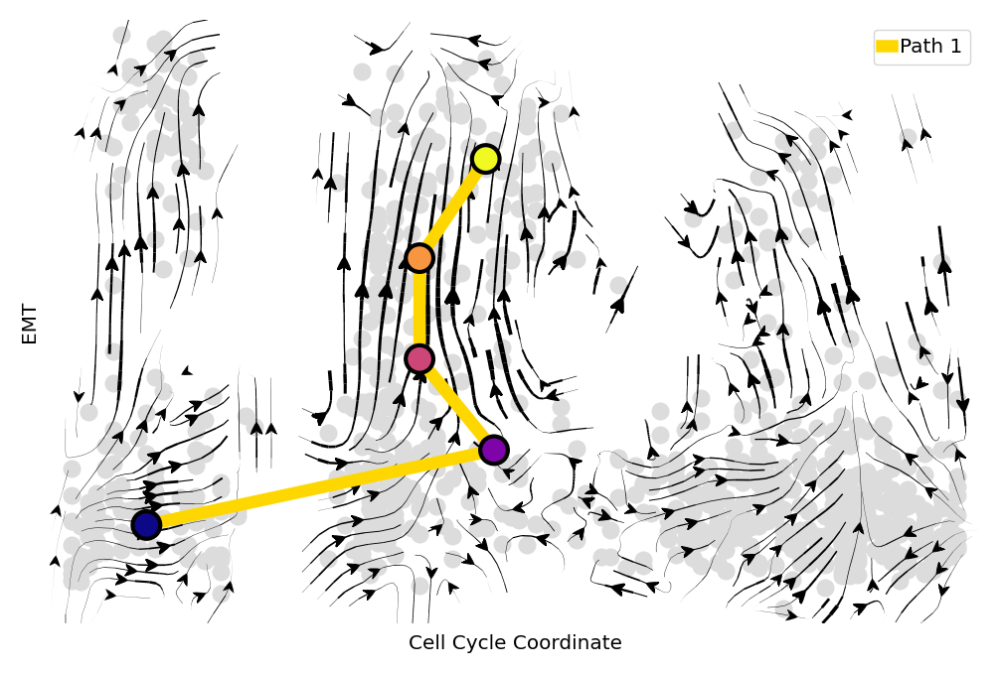

In [275]:
plt.subplot(1,1,1, frame_on=False)
plt.scatter(dose25.obsm['X_RC'][:,0],
            dose25.obsm['X_RC'][:,1],
            c='gainsboro', zorder=1)
dyn.pl.zstreamline(dose25, basis='RC', zorder=2)
plt.plot(first_path_traj_df['RC_adjusted'], first_path_traj_df['DC3'], 'gold', zorder=3, linewidth=4.5, label='Path 1')
plt.scatter(first_path_traj_df['RC_adjusted'], first_path_traj_df['DC3'], c=range(5), cmap='plasma', zorder=4, edgecolors='k', linewidth=1.5, s=100)
plt.legend()
plt.xlabel("Cell Cycle Coordinate")
plt.ylabel("EMT")
plt.xticks([])
plt.yticks([])
#plt.savefig("../plots/1000_trajs/umap_2_clusters_paths.png", dpi=300)

# Plotting both paths

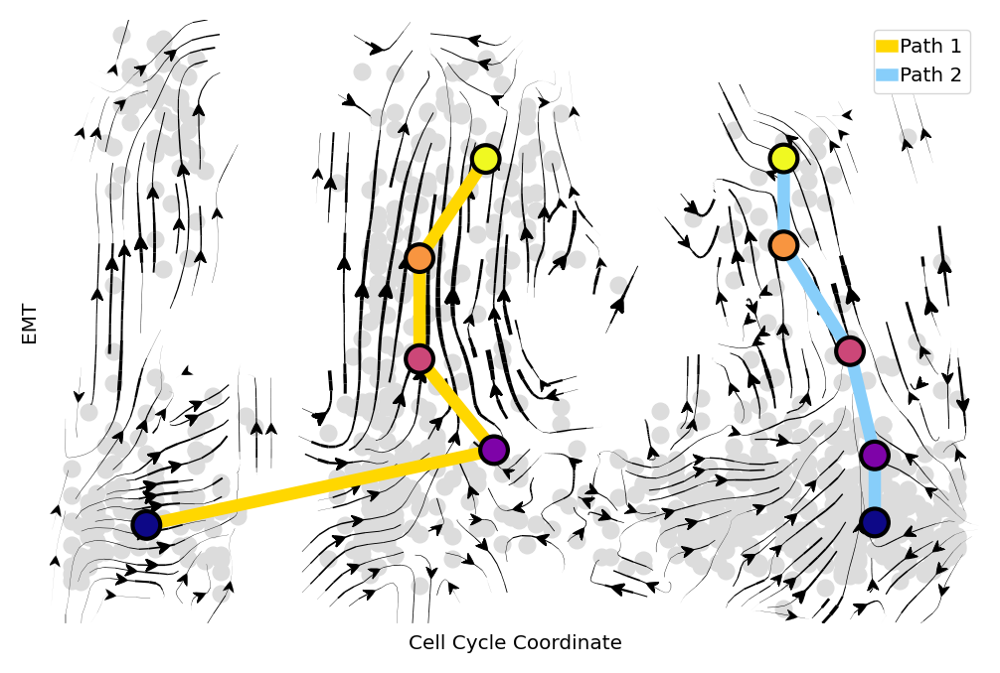

In [291]:
plt.subplot(1,1,1, frame_on=False)
plt.scatter(dose25.obsm['X_RC'][:,0],
            dose25.obsm['X_RC'][:,1],
            c='gainsboro', zorder=1)
dyn.pl.zstreamline(dose25, basis='RC', zorder=2)
plt.plot(first_path_traj_df['RC_adjusted'], first_path_traj_df['DC3'], 'gold', zorder=3, linewidth=4.5, label='Path 1')
plt.scatter(first_path_traj_df['RC_adjusted'], first_path_traj_df['DC3'], c=range(5), cmap='plasma', zorder=4, edgecolors='k', linewidth=1.5, s=100)

plt.plot(second_path_traj_df['RC_adjusted'], second_path_traj_df['DC3'], 'lightskyblue', zorder=3, linewidth=4.5, label='Path 2')
plt.scatter(second_path_traj_df['RC_adjusted'], second_path_traj_df['DC3'], c=range(5), cmap='plasma', zorder=4, edgecolors='k', linewidth=1.5, s=100)

plt.legend()
plt.xlabel("Cell Cycle Coordinate")
plt.ylabel("EMT")
plt.xticks([])
plt.yticks([])
#plt.savefig("../plots/dose25/CCC_EMT_two_paths.png", dpi=300)

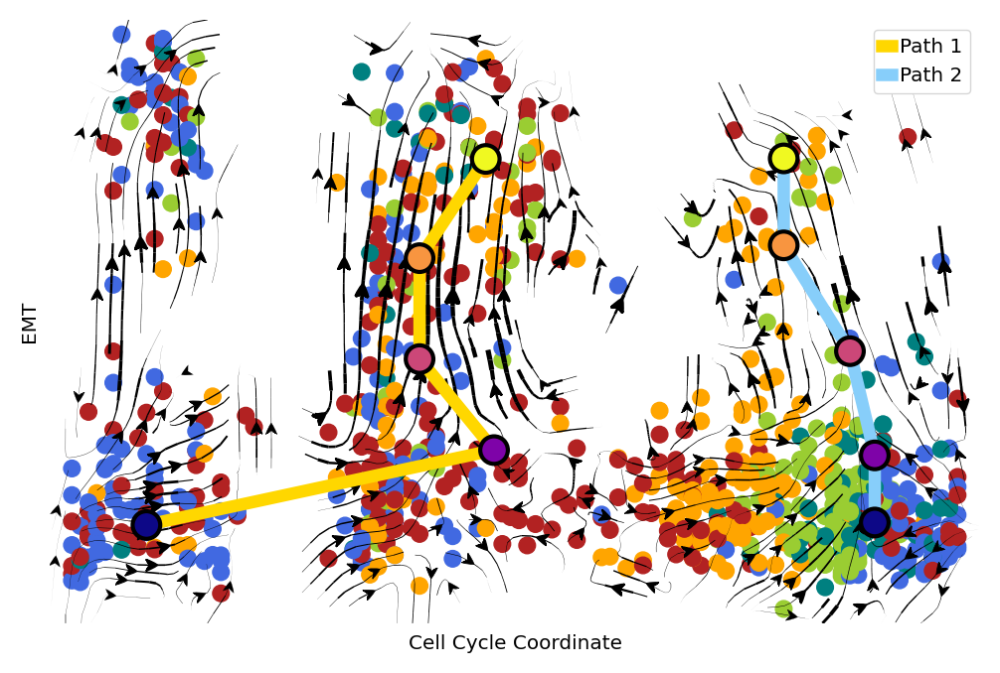

In [290]:
plt.subplot(1,1,1, frame_on=False)
plt.scatter(dose25.obsm['X_RC'][:,0],
            dose25.obsm['X_RC'][:,1],
            c=dose25.obs['cell_cycle_phase'].map(colors2), zorder=1)
dyn.pl.zstreamline(dose25, basis='RC', zorder=2)
plt.plot(first_path_traj_df['RC_adjusted'], first_path_traj_df['DC3'], 'gold', zorder=3, linewidth=4.5, label='Path 1')
plt.scatter(first_path_traj_df['RC_adjusted'], first_path_traj_df['DC3'], c=range(5), cmap='plasma', zorder=4, edgecolors='k', linewidth=1.5, s=100)

plt.plot(second_path_traj_df['RC_adjusted'], second_path_traj_df['DC3'], 'lightskyblue', zorder=3, linewidth=4.5, label='Path 2')
plt.scatter(second_path_traj_df['RC_adjusted'], second_path_traj_df['DC3'], c=range(5), cmap='plasma', zorder=4, edgecolors='k', linewidth=1.5, s=100)

plt.legend()
plt.xlabel("Cell Cycle Coordinate")
plt.ylabel("EMT")
plt.xticks([])
plt.yticks([])
#plt.savefig("../plots/dose25/CCC_EMT_two_paths_colored_by_cc.png", dpi=300)

In [279]:
first_path_traj_df['traj'] = 0
second_path_traj_df['traj'] = 1

In [284]:
first_path_traj_df['color'] = 'path1'
second_path_traj_df['color'] = 'path2'

In [285]:
combined_two_paths_df = pd.concat([first_path_traj_df, second_path_traj_df], axis=0)

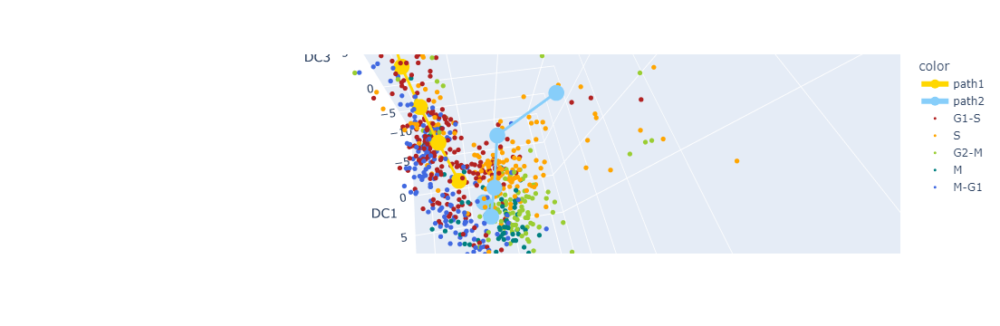

In [289]:
dc_3d_df = pd.DataFrame(dose25.obsm['X_DC'][:,:3], columns=['DC1','DC2','DC3'])
dc_3d_df['cell_cycle_phase'] = dose25.obs['cell_cycle_phase'].reset_index(drop=True)

fig = px.line_3d(combined_two_paths_df, x="DC1", y="DC2", z="DC3", color='color', color_discrete_map=path_dict, markers='0-', 
                 height=1000)
fig.update_traces(line={'width': 6,},
                  marker=dict(size=10))
for key in colors2_px.keys():
    df = dc_3d_df[dc_3d_df['cell_cycle_phase'] == key]
    fig.add_trace(go.Scatter3d( x=df['DC1'], 
                                y=df['DC2'], 
                                z=df['DC3'],
                                mode='markers',
                                name=key,
                                marker_color = colors2_px[key],
                                marker=dict(size=3)))
fig.show()
#fig.write_html("../plots/dose25/3d_DC_two_paths.html")